# TopoCluster Regression Rewrite

Here, we are going to write out our topo-cluster regression notebook. Let's start with charged pions, and see what we can do to understand them.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os

os.environ['CUDA_VISIBLE_DEVICES'] = "0"
os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

In [3]:
# ML fitting/loading/saving settings

loadModel = True # if false, then run trainings directly. otherwise load the file.
saveModel = False # if true, save the current model to disk.

from tensorflow.keras.models import load_model

In [4]:
#import libraries and some constants

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import pandas as pd
plotpath = '/home/mswiatlowski/start_tf/caloml-atlas-new/regression/Plots_rewrite/'
modelpath_c = '/home/mswiatlowski/start_tf/caloml-atlas-new/classifier/Models/'
modelpath = '/home/mswiatlowski/start_tf/caloml-atlas-new/regression/Models/'
# %config InlineBackend.figure_format = 'svg'

# metadata
layers = ["EMB1", "EMB2", "EMB3", "TileBar0", "TileBar1", "TileBar2"]
cell_size_phi = [0.098, 0.0245, 0.0245, 0.1, 0.1, 0.1]
cell_size_eta = [0.0031, 0.025, 0.05, 0.1, 0.1, 0.2]
len_phi = [4, 16, 16, 4, 4, 4]
len_eta = [128, 16, 8, 4, 4, 2]

In [5]:
# import our resolution utilities

import sys
sys.path.append('/home/mswiatlowski/start_tf/caloml-atlas/')
import resolution_util as ru
import plot_util as pu
import ml_util as mu
import uproot as ur

In [6]:
# import pi+

path = '/fast_scratch/atlas_images/v7/'
pp_file = ur.open(path+'piplus.root')
pp_tree = pp_file['ClusterTree']
branches = ['clusterIndex', 'truthE', 'nCluster', 'clusterE', 'clusterECalib', 'clusterPt', 'clusterEta', 'clusterPhi', 'cluster_nCells', 'cluster_sumCellE', 'cluster_ENG_CALIB_TOT', 'cluster_ENG_CALIB_OUT_T', 'cluster_ENG_CALIB_DEAD_TOT', 'cluster_EM_PROBABILITY', 'cluster_HAD_WEIGHT', 'cluster_CENTER_MAG', 'cluster_FIRST_ENG_DENS', 'cluster_cellE_norm']
pp = pd.DataFrame(pp_tree.arrays(expressions = branches, library='np'))
#unused: 'cluster_cell_dR_min', 'cluster_cell_dR_max', 'cluster_cell_dEta_min', 'cluster_cell_dEta_max', 'cluster_cell_dPhi_min', 'cluster_cell_dPhi_max', 'cluster_cell_centerCellEta', 'cluster_cell_centerCellPhi', 'cluster_cell_centerCellLayer', 'truthE', 'truthPt', 'truthEta', 'truthPhi', 'cluster_ENG_CALIB_OUT_T', 'cluster_ENG_CALIB_DEAD_TOT', 'cluster_OOC_WEIGHT', 'cluster_DM_WEIGHT', 'runNumber', 'eventNumber', 

print("Number of pi+ events: {}".format(len(pp)))

Number of pi+ events: 435967


In [7]:
#define convenience columns

pp['clusterEoverCalib'] = pp.clusterE / pp.cluster_ENG_CALIB_TOT
pp['clusterEoverTruth'] = pp.clusterE / pp.truthE
pp['cluster_ENG_ALL'] = pp.cluster_ENG_CALIB_TOT + pp.cluster_ENG_CALIB_OUT_T + pp.cluster_ENG_CALIB_DEAD_TOT

In [8]:
# regression variables: define up here to make it easier for later swapping

pp['logE'] = np.log(pp.clusterE)
pp['logECalib'] = np.log(pp.cluster_ENG_CALIB_TOT)
pp['logECalibAll'] = np.log(pp.cluster_ENG_ALL)

In [9]:
from sklearn.preprocessing import StandardScaler #this f'n standardizes data by removing the mean and scaling by the stddev
# create scaler
scaler_e = StandardScaler()
scaler_cal = StandardScaler()
scaler_calAll = StandardScaler()
# fit and transform in one step
pp['s_logE'] = scaler_e.fit_transform(pp['logE'].to_numpy().reshape(-1,1))
pp['s_logECalib'] = scaler_cal.fit_transform(pp['logECalib'].to_numpy().reshape(-1,1))
pp['s_logECalibAll'] = scaler_calAll.fit_transform(pp['logECalibAll'].to_numpy().reshape(-1,1))


In [10]:
# fun cleaning for EMProb
epsilon = 0.000000000001
pp['cluster_fixEM'] = pp.cluster_EM_PROBABILITY.replace(to_replace=0,value=epsilon)

In [11]:
pp['cluster_logEM'] = np.log(pp.cluster_fixEM)

In [12]:
scaler_EM = StandardScaler()
pp['s_logEM'] = scaler_EM.fit_transform(pp.cluster_logEM.to_numpy().reshape(-1,1))

In [13]:
scaler_eta = StandardScaler()
pp['s_eta'] = scaler_eta.fit_transform(pp.clusterEta.to_numpy().reshape(-1,1))

In [14]:
pp['logCenter'] = np.log(pp.cluster_CENTER_MAG)
scaler_center = StandardScaler()
pp['s_logCenter'] = scaler_center.fit_transform(pp.logCenter.to_numpy().reshape(-1,1))

In [15]:
scaler_density = StandardScaler()
pp['s_Density'] = scaler_density.fit_transform(pp.cluster_FIRST_ENG_DENS.to_numpy().reshape(-1,1))

In [16]:
# define convience sub-frames

pp['Single'] = pp.nCluster==1 # define a subset of events with only one cluster
mu.splitFrameTVT(pp, trainfrac = 0.7)          # define a train/test fraction of 70/20% (10% for val at this point)

In [17]:
EMB1_cells = mu.setupCells(pp_tree, 'EMB1') # implicitly flatten
EMB2_cells = mu.setupCells(pp_tree, 'EMB2')
EMB3_cells = mu.setupCells(pp_tree, 'EMB3') # implicitly flatten

TileBar0_cells = mu.setupCells(pp_tree, 'TileBar0') # implicitly flatten
TileBar1_cells = mu.setupCells(pp_tree, 'TileBar1') # implicitly flatten
TileBar2_cells = mu.setupCells(pp_tree, 'TileBar2') # implicitly flatten


In [18]:
from tensorflow.keras import regularizers
from tensorflow.keras import Sequential
from tensorflow.keras import Model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from keras.wrappers.scikit_learn import KerasRegressor

In [30]:
import tensorflow as tf

strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:2"])
ngpu = strategy.num_replicas_in_sync
print ('Number of devices: {}'.format(ngpu))

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:2')
Number of devices: 2


In [20]:

combine_All_cells = np.concatenate((EMB1_cells, EMB2_cells, EMB3_cells, TileBar0_cells, TileBar1_cells, TileBar2_cells), axis=1)
s_All_cells, scaler_All_cells = mu.standardCells(combine_All_cells, ['EMB1', 'EMB2', 'EMB3', 'TileBar0', 'TileBar1', 'TileBar2'])
All_input = np.column_stack((pp['s_logE'],pp['s_eta'],s_All_cells))

## Done with pre-setup stuff here

No handles with labels found to put in legend.


<Figure size 799.992x599.976 with 0 Axes>

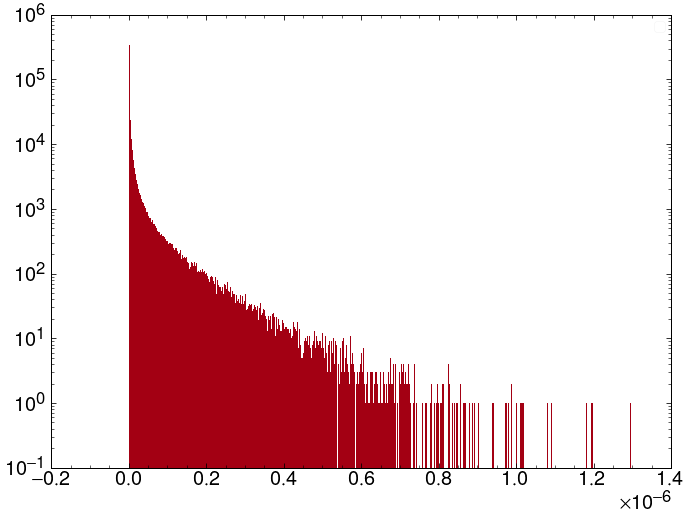

In [21]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.cluster_FIRST_ENG_DENS,bins = n_bins)
plt.yscale('log')
# plt.xlabel('Learned - Actual Energy')
plt.legend()
plt.show()

<Figure size 799.992x599.976 with 0 Axes>

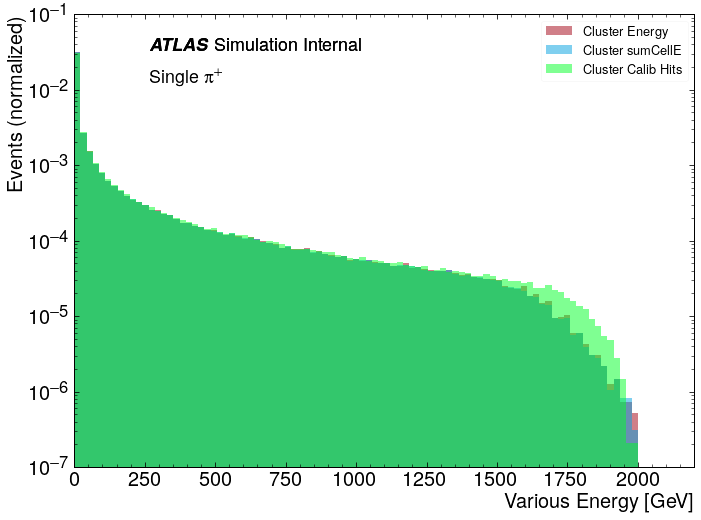

In [23]:
pu.histogramOverlay(frames = [pp, pp, pp],
                    data =  ['clusterE', 'cluster_sumCellE', 'cluster_ENG_CALIB_TOT'],
                    labels =['Cluster Energy', 'Cluster sumCellE', 'Cluster Calib Hits'],
                    xlabel = 'Various Energy [GeV]',
                    ylabel = 'Events (normalized)',
                    figfile = './hist_energy.pdf',
                    x_min = 0, x_max = 2200, xbins = 100, normed = True, y_log = True,
                    atlas_x = 0.12, atlas_y = 0.95, simulation = True,
                    textlist = [{'x': 0.12, 'y': 0.85, 'text': 'Single $\pi^{+}$'}])

## Let's make some response plots now!

This is what we wanted! Nice. Can see the shapes that we expect. Let's wrap this all into a function.

<Figure size 799.992x599.976 with 0 Axes>

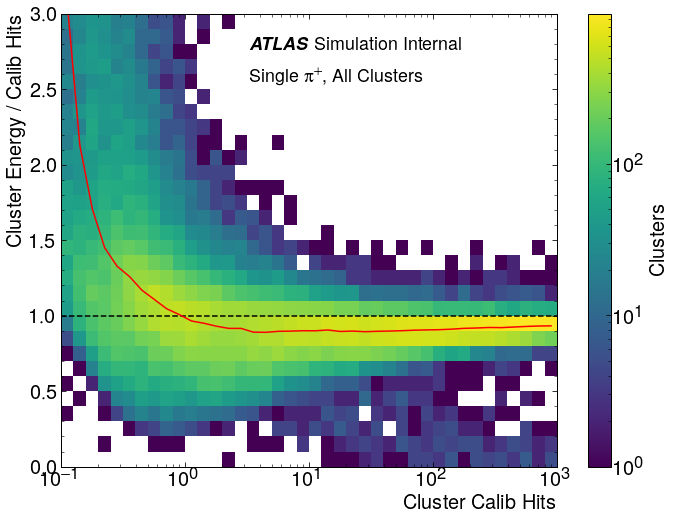

In [25]:
xcenter, medBase = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                      pp[pp.test].clusterEoverCalib, 
                      figfile = './hist_2D_calib_vs_ratio_pp_profile.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'}])

Above, we can see the dip below 1 at 2-5 GeV, the rise to 1 above that, and the rise way above 1 below that. Interesting!

<Figure size 799.992x599.976 with 0 Axes>

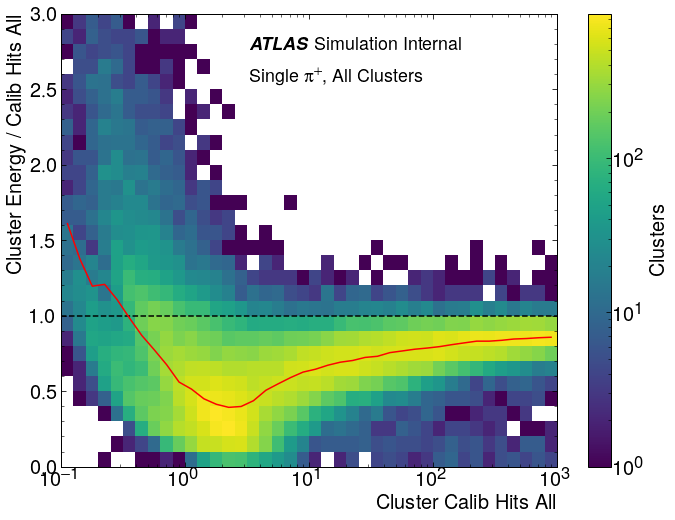

In [26]:
xcenter, medAll = ru.responsePlot(pp[pp.test].cluster_ENG_ALL, 
                      pp[pp.test].clusterE / pp[pp.test].cluster_ENG_ALL, 
                      figfile = './hist_2D_calibAll_vs_ratioAll_pp_profile.pdf', statistic = 'median',
                      xlabel = 'Cluster Calib Hits All', ylabel = 'Cluster Energy / Calib Hits All',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'}])

We see it's way lower! Could it be that when the energy / true is very high in the previous plot, it's because "true" is missing energy outside the cluster or in the dead material? But the cluster itself shoudln't be picking that up. Weird.

<Figure size 799.992x599.976 with 0 Axes>

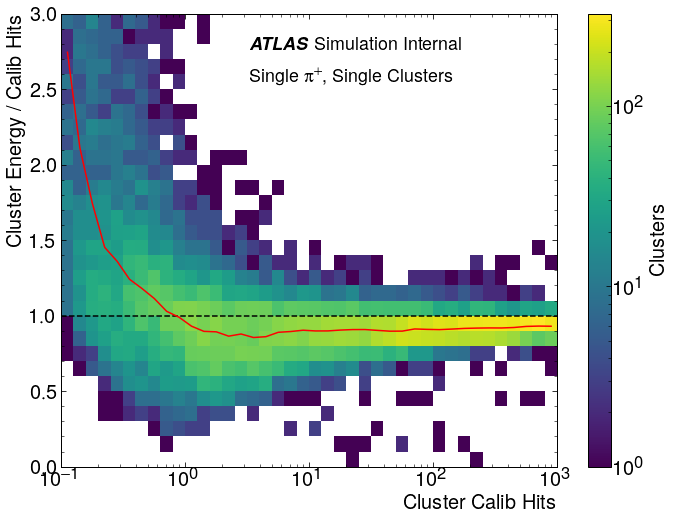

In [27]:
xcenter, medSingleBase = ru.responsePlot(pp[pp.test & pp.Single].cluster_ENG_CALIB_TOT, 
                         pp[pp.test & pp.Single].clusterEoverCalib, 
                         figfile = './hist_2D_calib_vs_ratio_pp_profile_Single.pdf', statistic = 'median',
                         atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                         textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

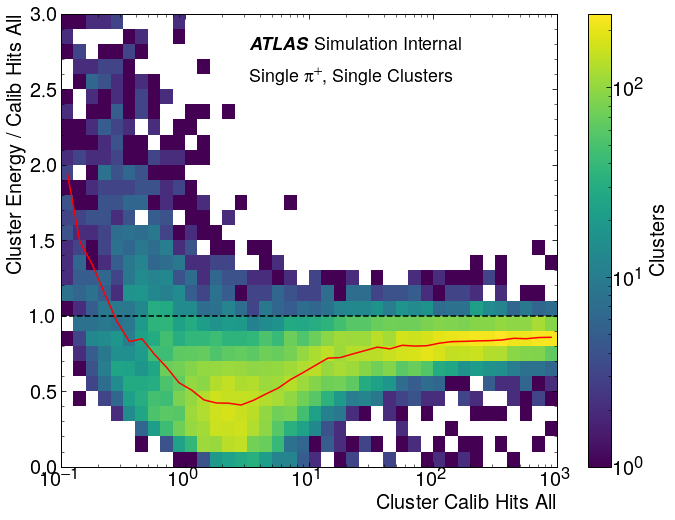

In [28]:
xcenter, medSingleAll = ru.responsePlot(pp[pp.test & pp.Single].cluster_ENG_ALL, 
                      pp[pp.test & pp.Single].clusterE / pp[pp.test & pp.Single].cluster_ENG_ALL, 
                      figfile = './hist_2D_calibAll_vs_ratioAll_pp_profile_Single.pdf', statistic = 'median',
                      xlabel = 'Cluster Calib Hits All', ylabel = 'Cluster Energy / Calib Hits All',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

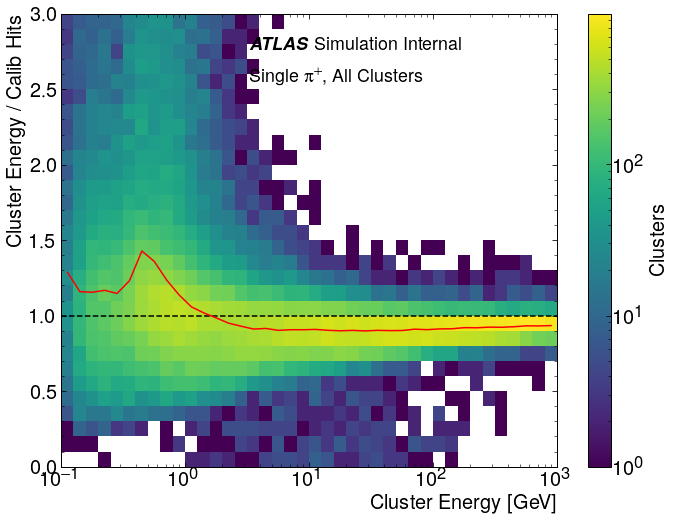

In [29]:
xcenter, medBase_E = ru.responsePlot(pp[pp.test].clusterE,
                      pp[pp.test].clusterE / pp[pp.test].cluster_ENG_CALIB_TOT, 
                      figfile ='./hist_2D_E_vs_ratio_pp_profile.pdf', statistic = 'median',
                      xlabel = 'Cluster Energy [GeV]', ylabel = 'Cluster Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'}])

## Let's implement the basic regression again!

Need to remember to use the strategy context everywhere, or else the multi-gpu isn't used, but the batch size is increased!!!

In [31]:
# Define a very basic regression: one input, one output


def baseline_model():
    regressor = Sequential()
    regressor.add(Dense(units=24, input_dim=1, kernel_initializer='normal', activation='relu'))
    regressor.add(Dense(units=24, kernel_initializer='normal', activation='relu'))
    regressor.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
    opt = Adam(lr=1e-4, decay=1e-6)
    regressor.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])

    return regressor

In [32]:
from keras.wrappers.scikit_learn import KerasRegressor

regressor = KerasRegressor(build_fn=baseline_model, batch_size=200*ngpu, epochs=50, verbose=1)
print(baseline_model().summary())

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 24)                48        
_________________________________________________________________
dense_1 (Dense)              (None, 24)                600       
_________________________________________________________________
dense_2 (Dense)         

In [37]:
#if not loadModel:
history_baseline = regressor.fit([pp[pp.train].s_logE.to_numpy()], pp[pp.train].s_logECalib.to_numpy())
#else:
 #   regressor.model = load_model(modelpath + 'baseline.h5')

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Epoch 1/50
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:GPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:0').
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:GPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:0').
INFO:tensorflow:Reduce to /job:localhost/replica:0/task

In [34]:
if saveModel:
    regressor.model.save(modelpath + 'baseline.h5')

In [38]:
pp['predict_base_E'] = np.exp(scaler_cal.inverse_transform(regressor.predict([pp.s_logE.to_numpy()])))

1090/1090 [==============================] - 3s 2ms/step


No handles with labels found to put in legend.


<Figure size 799.992x599.976 with 0 Axes>

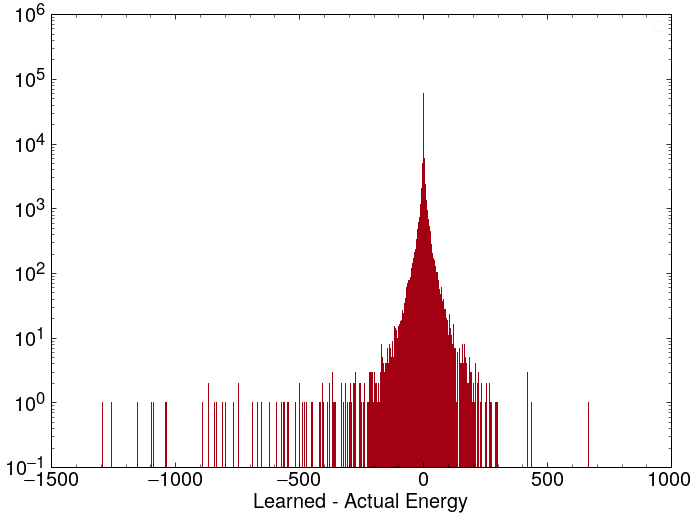

In [39]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp[pp.test].predict_base_E-pp[pp.test].cluster_ENG_CALIB_TOT,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Actual Energy')
plt.legend()#good metric
plt.show()

No handles with labels found to put in legend.


<Figure size 799.992x599.976 with 0 Axes>

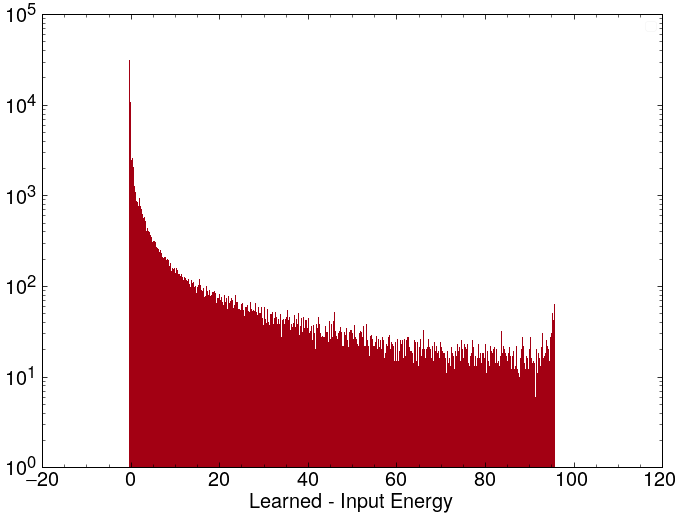

In [40]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp[pp.test].predict_base_E-pp[pp.test].clusterE,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Input Energy')
plt.legend()
plt.show()

In [41]:
pp['predict_base_EoverCalib'] = pp.predict_base_E / pp.cluster_ENG_CALIB_TOT

<Figure size 799.992x599.976 with 0 Axes>

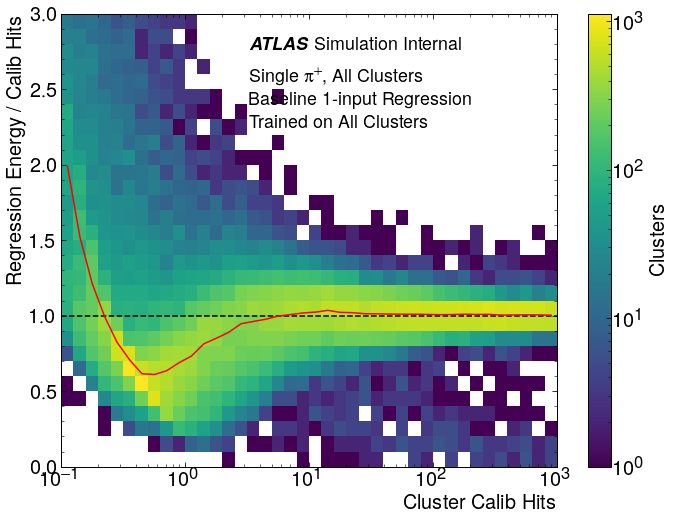

In [43]:
xcenter, medReg = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                      pp[pp.test].predict_base_EoverCalib,
                      figfile = './hist_2D_calib_vs_ratioReg_pp_profile.pdf', statistic = 'median',
                      xlabel = 'Cluster Calib Hits', ylabel = 'Regression Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'Baseline 1-input Regression'},
                                  {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

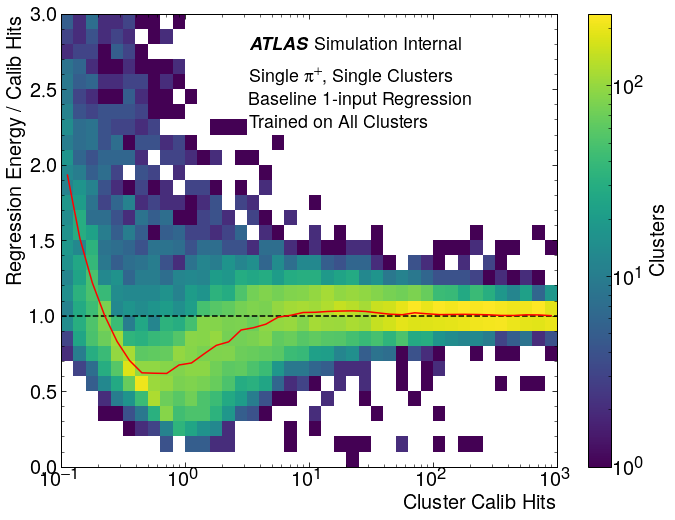

In [44]:
xcenter, medRegSingle = ru.responsePlot(pp[pp.test & pp.Single].cluster_ENG_CALIB_TOT, 
                      pp[pp.test & pp.Single].predict_base_EoverCalib,
                      figfile = './hist_2D_calib_vs_ratioReg_pp_profile_Single.pdf', statistic = 'median',
                      xlabel = 'Cluster Calib Hits', ylabel = 'Regression Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'Baseline 1-input Regression'},
                                  {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

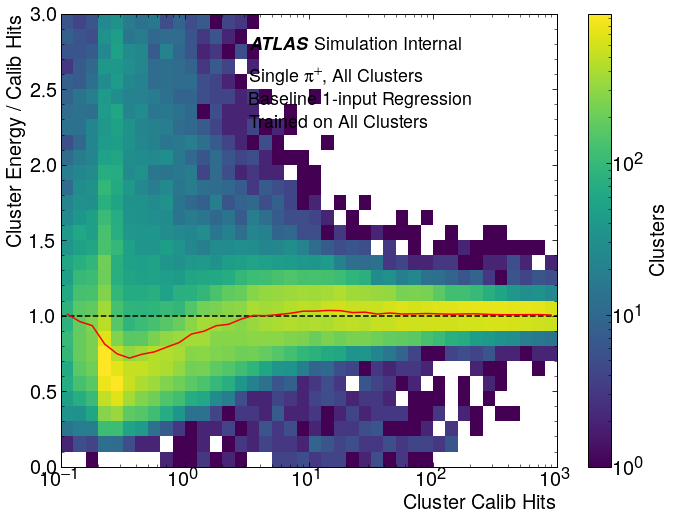

In [45]:
xcenter, medReg_E = ru.responsePlot(pp[pp.test].predict_base_E,
                      pp[pp.test].predict_base_EoverCalib,
                      figfile = './hist_2D_regE_vs_ratioReg_pp_profile.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                      {'x': 0.38, 'y': 0.8,  'text': 'Baseline 1-input Regression'},
                                  {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

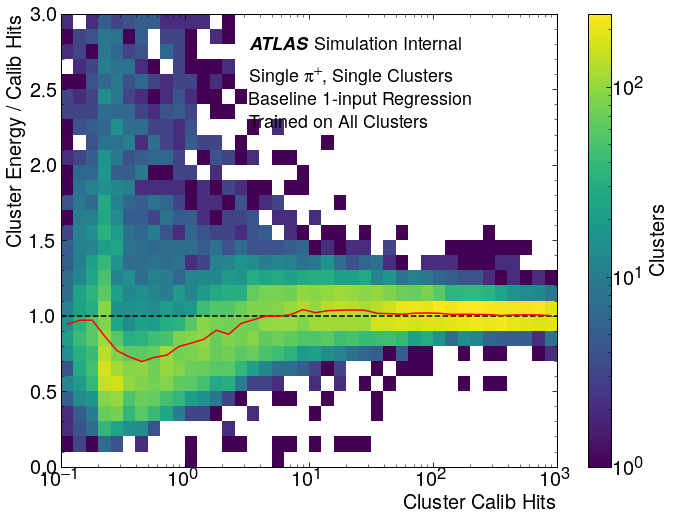

In [46]:
xcenter, medRegSingle_E = ru.responsePlot(pp[pp.test & pp.Single].predict_base_E,
                      pp[pp.test & pp.Single].predict_base_EoverCalib,
                      figfile = './hist_2D_regE_vs_ratioReg_pp_profile_Single.pdf', statistic = 'median',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'},
                      {'x': 0.38, 'y': 0.8,  'text': 'Baseline 1-input Regression'},
                                  {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

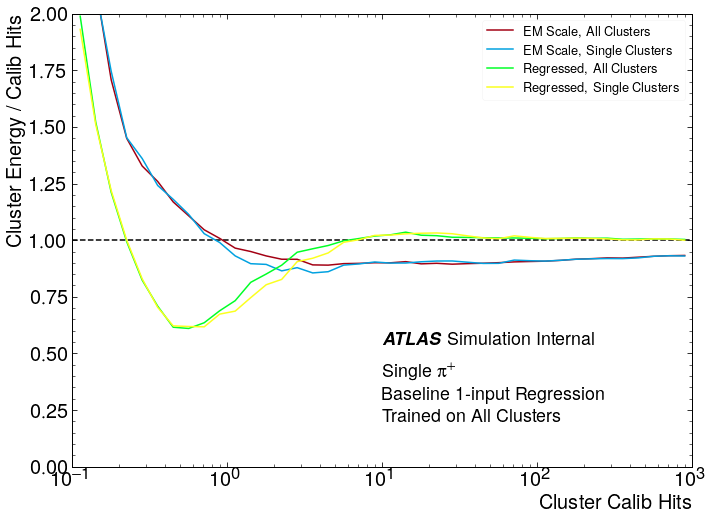

In [47]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medSingleBase, medReg, medRegSingle],
                labels = ['EM Scale, All Clusters', 'EM Scale, Single Clusters', 'Regressed, All Clusters', 'Regressed, Single Clusters'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = "./hist_2D_calib_vs_ratio_pp_profile_Overlay_BaseRegSingle.pdf",
                extra_lines = [[[0.1,1000],[1,1]]],
                atlas_x = 0.5, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.2, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.15,  'text': 'Baseline 1-input Regression'},
                                  {'x': 0.5, 'y': 0.1, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

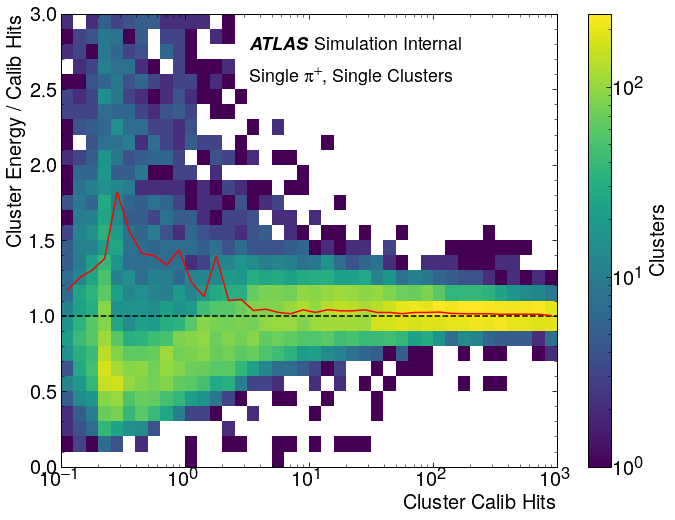

([0.11294627058970837,
  0.14219093021276402,
  0.17900777537149964,
  0.22535743732392294,
  0.2837082045838979,
  0.3571674682851675,
  0.44964720209038467,
  0.5660722890537326,
  0.7126427896022371,
  0.8971641173621403,
  1.1294627058970828,
  1.4219093021276392,
  1.7900777537149957,
  2.2535743732392284,
  2.837082045838977,
  3.5716746828516728,
  4.496472020903845,
  5.660722890537323,
  7.126427896022365,
  8.971641173621396,
  11.294627058970825,
  14.219093021276386,
  17.90077753714994,
  22.53574373239227,
  28.370820458389765,
  35.716746828516726,
  44.96472020903842,
  56.60722890537319,
  71.26427896022365,
  89.71641173621393,
  112.94627058970815,
  142.1909302127638,
  179.00777537149938,
  225.35743732392268,
  283.7082045838975,
  357.16746828516693,
  449.647202090384,
  566.0722890537315,
  712.6427896022358,
  897.1641173621388],
 array([1.16907962, 1.25292232, 1.30149013, 1.37880547, 1.81881078,
        1.55679655, 1.41170452, 1.39698256, 1.33642118, 1.434764

In [48]:
#for completelness, test the mean, but nothing crazy
ru.responsePlot(pp[pp.test & pp.Single].predict_base_E,
                      pp[pp.test & pp.Single].predict_base_EoverCalib,
                      statistic = 'mean',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

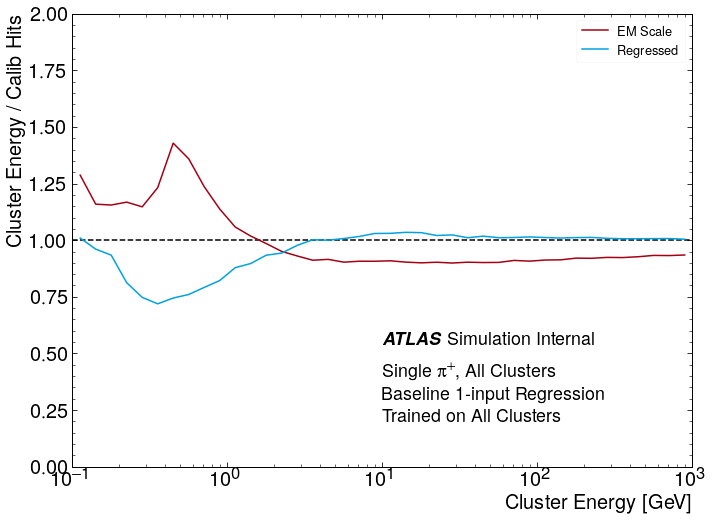

In [50]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase_E, medReg_E],
                labels = ['EM Scale', 'Regressed'],
                xlabel = 'Cluster Energy [GeV]', ylabel = 'Cluster Energy / Calib Hits',
                figfile = "./hist_2D_e_vs_ratio_pp_profile_Overlay_BaseReg.pdf",
                extra_lines = [[[0.1,1000],[1,1]]],
                atlas_x = 0.5, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.2, 'text': 'Single $\pi^{+}$, All Clusters'},
                                  {'x': 0.5, 'y': 0.15,  'text': 'Baseline 1-input Regression'},
                                  {'x': 0.5, 'y': 0.1, 'text': 'Trained on All Clusters'}])

## Now let's do resolution plots!

<Figure size 799.992x599.976 with 0 Axes>

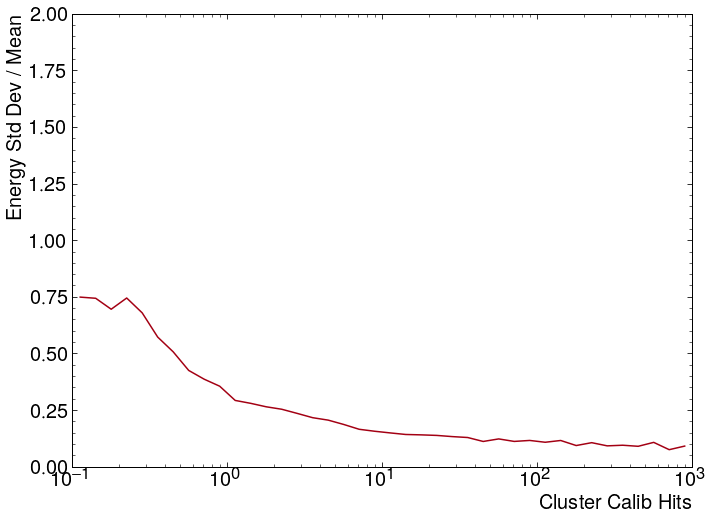

<Figure size 799.992x599.976 with 0 Axes>

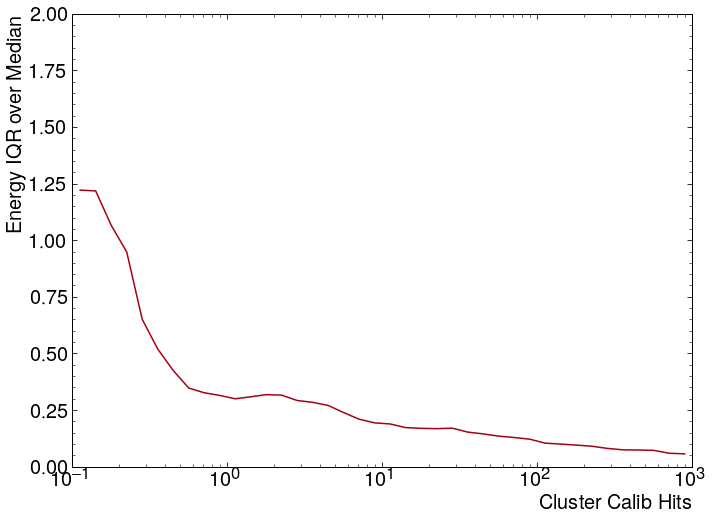

In [51]:
xcenter, stdOverMeanBase = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].clusterEoverCalib,
                './hist_2D_calib_vs_ratio_pp_stdMean', statistic='stdOverMean',
                ylabel = 'Energy Std Dev / Mean')
xcenter, iqrOverMedBase = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].clusterEoverCalib,
                './hist_2D_calib_vs_ratio_pp_iqrMed', statistic='iqrOverMed')

<Figure size 799.992x599.976 with 0 Axes>

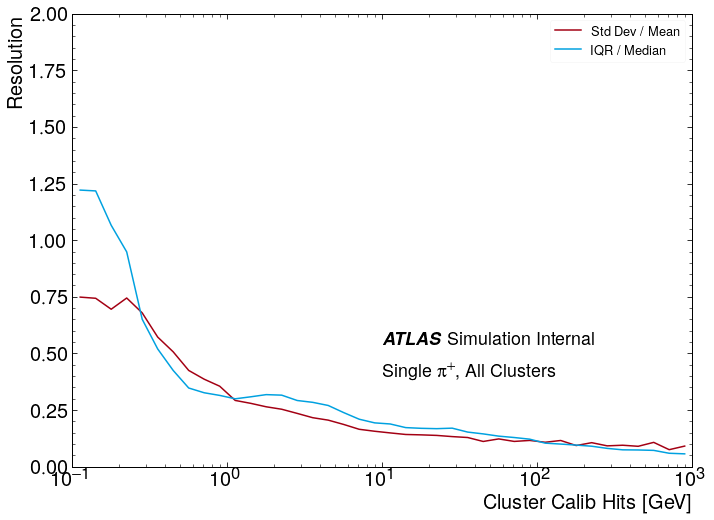

In [52]:
pu.lineOverlay(xcenter=xcenter, lines = [stdOverMeanBase, iqrOverMedBase],
                labels = ['Std Dev / Mean', 'IQR / Median'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Resolution',
                atlas_x = 0.5, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.2, 'text': 'Single $\pi^{+}$, All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

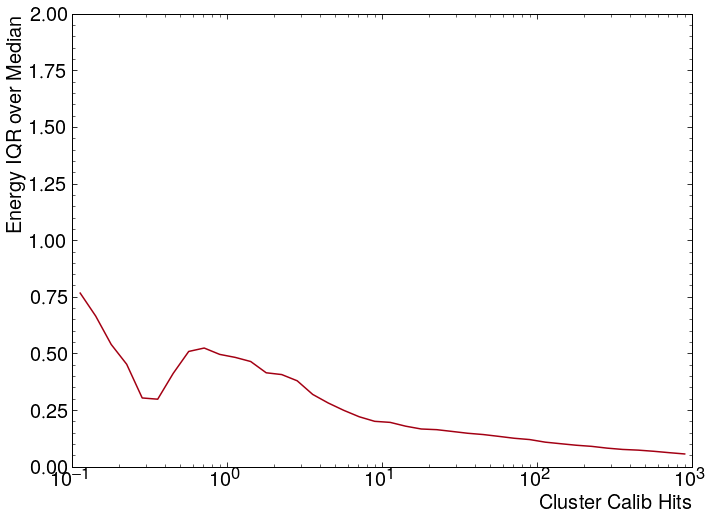

<Figure size 799.992x599.976 with 0 Axes>

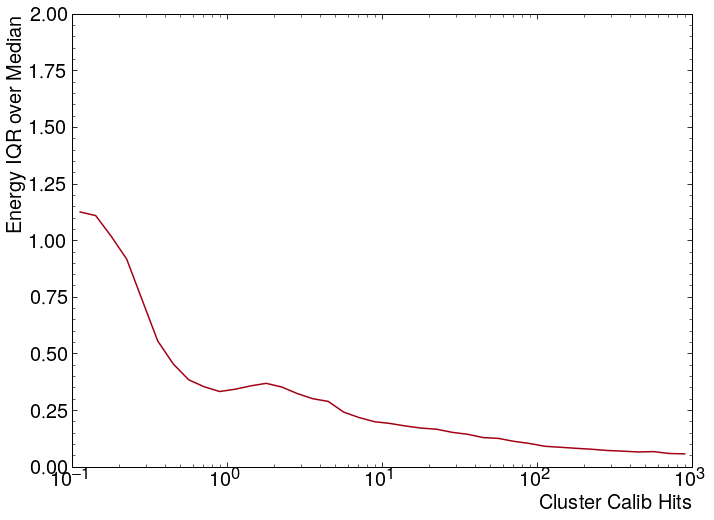

<Figure size 799.992x599.976 with 0 Axes>

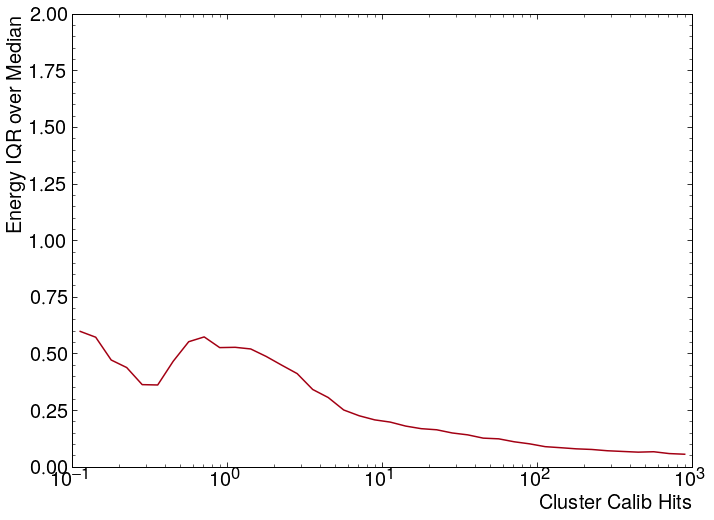

In [53]:
xcenter, iqrOverMedReg = ru.resolutionPlot(pp.cluster_ENG_CALIB_TOT,  pp.predict_base_E / pp.cluster_ENG_CALIB_TOT, statistic='iqrOverMed')
xcenter, iqrOverMedSingle = ru.resolutionPlot(pp[pp.Single].cluster_ENG_CALIB_TOT,  pp[pp.Single].clusterE / pp[pp.Single].cluster_ENG_CALIB_TOT, statistic='iqrOverMed')
xcenter, iqrOverMedRegSingle = ru.resolutionPlot(pp[pp.Single].cluster_ENG_CALIB_TOT,  pp[pp.Single].predict_base_E/ pp[pp.Single].cluster_ENG_CALIB_TOT, statistic='iqrOverMed')

Now we can compare how we're doing with the original resolution, and the regressed one:

<Figure size 799.992x599.976 with 0 Axes>

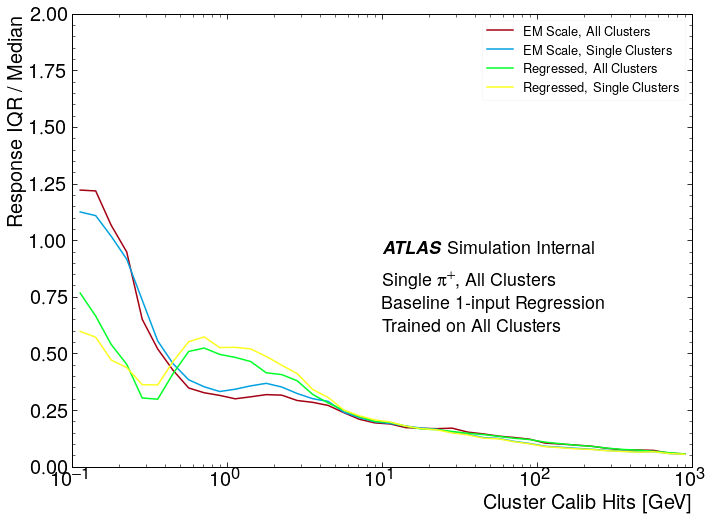

In [54]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase, iqrOverMedSingle, iqrOverMedReg, iqrOverMedRegSingle],
                labels = ['EM Scale, All Clusters', 'EM Scale, Single Clusters', 'Regressed, All Clusters', 'Regressed, Single Clusters'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                atlas_x = 0.5, atlas_y = 0.5, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.4, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.35,  'text': 'Baseline 1-input Regression'},
                            {'x': 0.5, 'y': 0.3, 'text': 'Trained on All Clusters'}])

That looks interesting. Some variation at low, probably due to the huge movements up/down we have. But later on, no improvement-- expected because we're only regressing on energy.

Regression is doing worse on single clusters, though to be fair, the original single clusters had worse resolution there too. Need to test training on single, applying to all, as well.

## Let's add one feature to the regressor

Just to keep it simple, we can make this the LC EM Probability, and see how we do

In [55]:
def baseline_wlc_model():
    with strategy.scope():
        regressor = Sequential()
        regressor.add(Dense(units=24, input_dim=2, kernel_initializer='normal', activation='relu'))
        regressor.add(Dense(units=24, kernel_initializer='normal', activation='relu'))
        regressor.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
        opt = Adam(lr=1e-4, decay=1e-6)
        regressor.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])

    return regressor

In [56]:

regressor_wlc = KerasRegressor(build_fn=baseline_wlc_model, batch_size=200*ngpu, epochs=100, verbose=1)
print(baseline_wlc_model().summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 24)                72        
_________________________________________________________________
dense_7 (Dense)              (None, 24)                600       
_________________________________________________________________
dense_8 (Dense)              (None, 1)                 25        
Total params: 697
Trainable params: 697
Non-trainable params: 0
_________________________________________________________________
None


No handles with labels found to put in legend.


<Figure size 799.992x599.976 with 0 Axes>

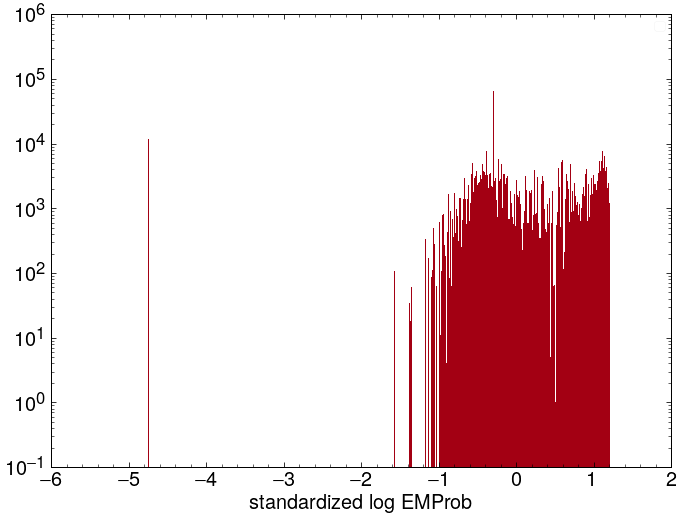

In [57]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.s_logEM,bins = n_bins)
plt.yscale('log')
plt.xlabel('standardized log EMProb')
plt.legend()
plt.show()

Train the regressor with the LC input here. Standardization of the emprob done above. Now we are also cleaning particularly bad cases.

In [58]:
#if not loadModel:
history_baseline_wlc = regressor_wlc.fit(pp[pp.train][['s_logE','s_logEM']].to_numpy(), pp[pp.train].s_logECalib.to_numpy())
#else:
 #   regressor_wlc.model = load_model(modelpath + 'baseline_wlc.h5')

Epoch 1/100
763/763 [==============================] - 7s 6ms/step - loss: 0.8911 - mae: 0.8001 - mse: 0.8911
Epoch 2/100
763/763 [==============================] - 4s 6ms/step - loss: 0.0700 - mae: 0.1841 - mse: 0.0700
Epoch 3/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0320 - mae: 0.1244 - mse: 0.0320
Epoch 4/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0303 - mae: 0.1171 - mse: 0.0303
Epoch 5/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0291 - mae: 0.1102 - mse: 0.0291
Epoch 6/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0289 - mae: 0.1066 - mse: 0.0289
Epoch 7/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0284 - mae: 0.1035 - mse: 0.0284
Epoch 8/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0280 - mae: 0.1011 - mse: 0.0280
Epoch 9/100
763/763 [==============================] - 4s 5ms/step - loss: 0.0277 - mae: 0.0996 - mse: 0.0277
Epoch 10/1

In [50]:
if saveModel:
    regressor_wlc.model.save(modelpath + 'baseline_wlc.h5')

In [59]:
                            # np.exp(scaler_cal.inverse_transform(regressor.predict([pp.s_logE.to_numpy()])))
pp['predict_base_wlc_E'] = np.exp(scaler_cal.inverse_transform(regressor_wlc.predict([pp[['s_logE','s_logEM']].to_numpy()])))

1090/1090 [==============================] - 4s 2ms/step


No handles with labels found to put in legend.


<Figure size 799.992x599.976 with 0 Axes>

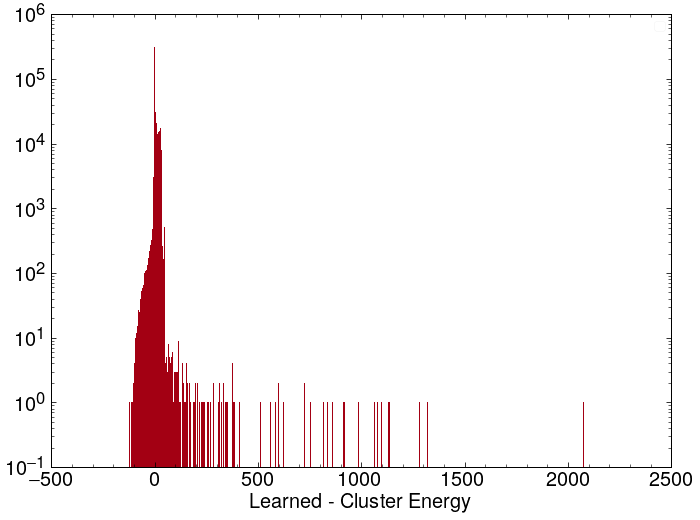

In [60]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_base_wlc_E-pp.clusterE,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Cluster Energy')
plt.legend()
plt.show()

No handles with labels found to put in legend.


<Figure size 799.992x599.976 with 0 Axes>

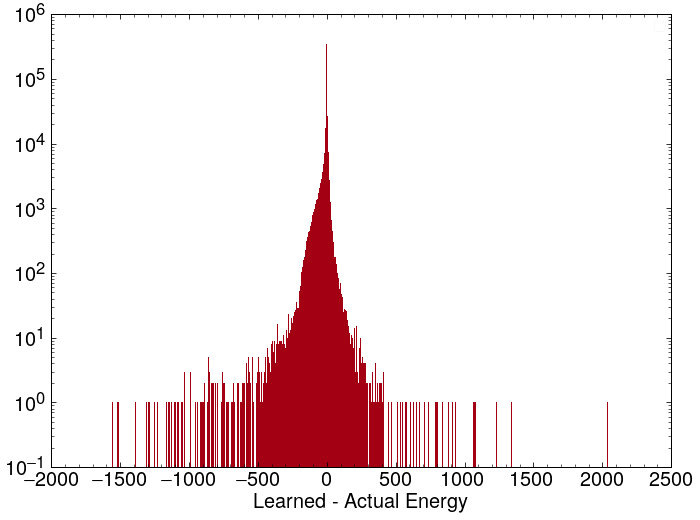

In [61]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_base_wlc_E-pp.cluster_ENG_CALIB_TOT,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Actual Energy')
plt.legend()
plt.show()

In [62]:
pp['predict_base_wlc_EoverCalib'] = pp.predict_base_wlc_E / pp.cluster_ENG_CALIB_TOT

<Figure size 799.992x599.976 with 0 Axes>

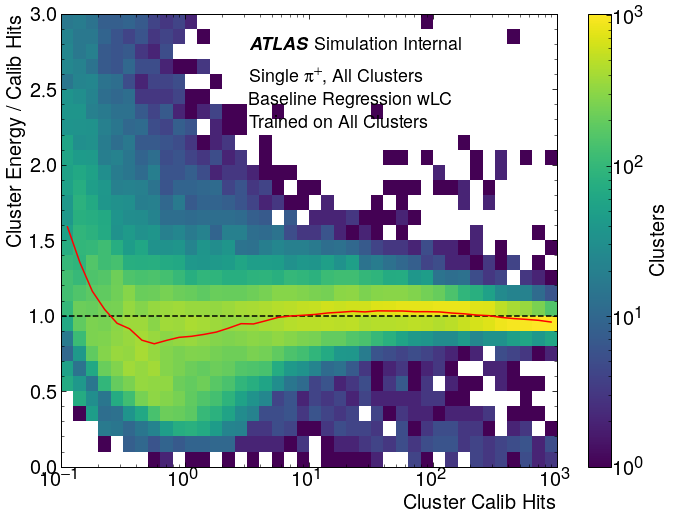

In [63]:
xcenter, medRegwLC = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_base_wlc_EoverCalib,
                 './hist_2D_calib_vs_ratioReg_wlc_pp_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'Baseline Regression wLC'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

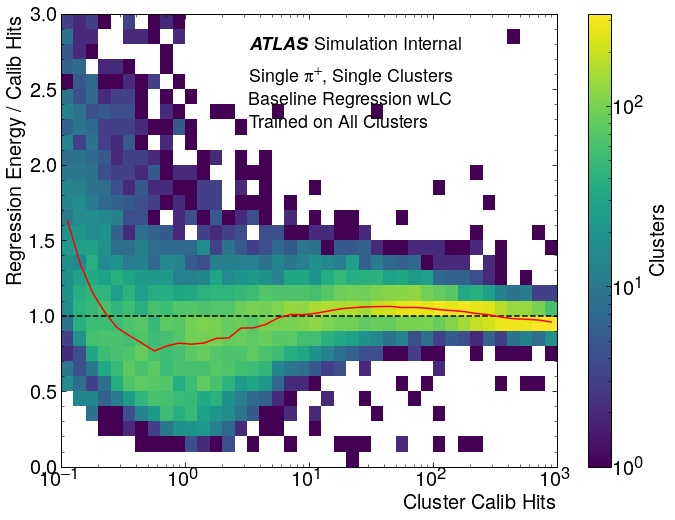

In [64]:
xcenter, medRegwLCSingle = ru.responsePlot(pp[pp.test & pp.Single].cluster_ENG_CALIB_TOT, 
                      pp[pp.test & pp.Single].predict_base_wlc_EoverCalib,
                      xlabel = 'Cluster Calib Hits', ylabel = 'Regression Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'Baseline Regression wLC'},
                                  {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

Hah, it works!! I was just not re-evaluating it properly last time. It was the regularization: absolutely have to log and regularize everything.

Let's make plots comparing scales and resolutions. TODO: add info to arrays for the hadronic calibration alone, not the total energy.

IndexError: list index out of range

<Figure size 799.992x599.976 with 0 Axes>

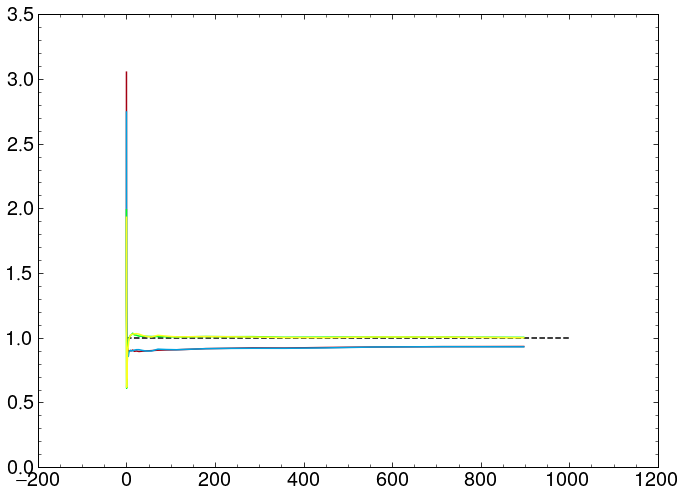

In [66]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medSingleBase, medReg, medRegSingle, medRegwLC, medRegwLCSingle],
                labels = ['EM Scale, All Clusters', 'EM Scale, Single Clusters', 'Regressed, All Clusters', 'Regressed, Single Clusters', 'Regressed w/LC All', 'Regressed w/LC Single'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                extra_lines = [[[0.1,1000],[1,1]]],
                atlas_x = 0.5, atlas_y = 0.3, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.2, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.15,  'text': 'Baseline Regression'},
                                  {'x': 0.5, 'y': 0.1, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

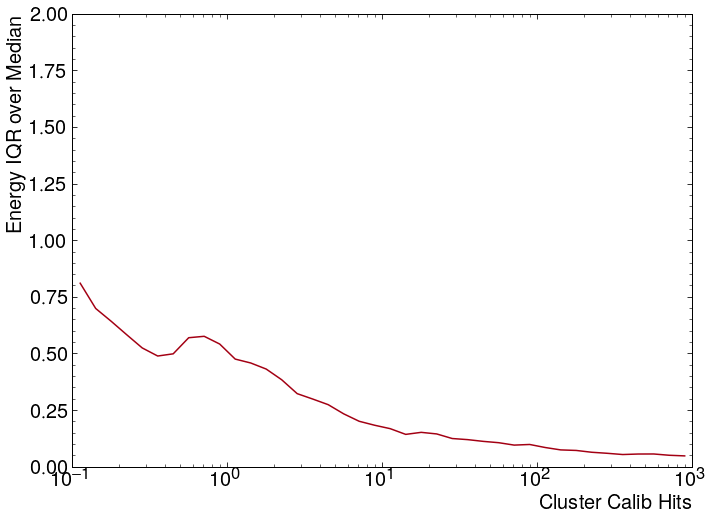

In [67]:
xcenter, iqrOverMedRegwlc = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT,
                                                pp[pp.test].predict_base_wlc_EoverCalib,
                                                './hist_2D_calib_vs_baselineregwLCratio_pp_iqrMed.pdf', statistic='iqrOverMed')

<Figure size 799.992x599.976 with 0 Axes>

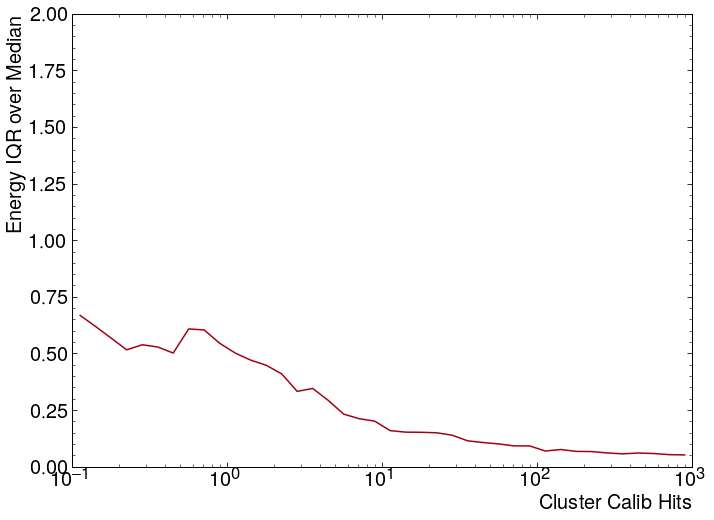

In [68]:
xcenter, iqrOverMedRegwlcSingle = ru.resolutionPlot(pp[pp.Single & pp.test].cluster_ENG_CALIB_TOT,
                                                pp[pp.Single & pp.test].predict_base_wlc_EoverCalib,
                                                './hist_2D_calib_vs_baselineregwLCratio_pp_iqrMed_Single.pdf', statistic='iqrOverMed')

IndexError: list index out of range

<Figure size 799.992x599.976 with 0 Axes>

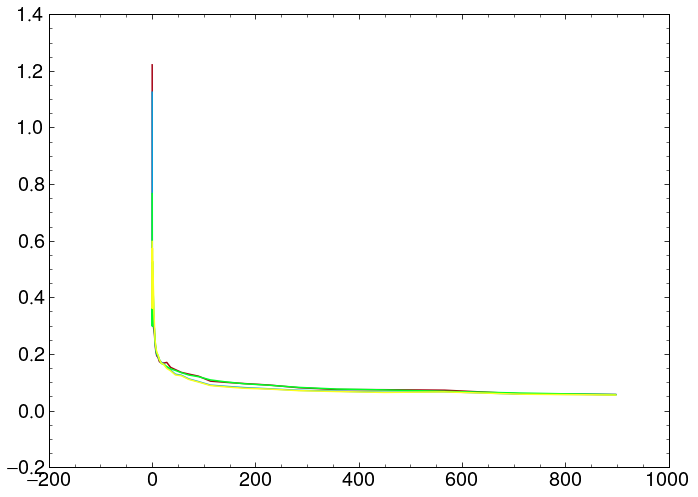

In [69]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase, iqrOverMedSingle, iqrOverMedReg, iqrOverMedRegSingle, iqrOverMedRegwlc, iqrOverMedRegwlcSingle],
                labels = ['EM Scale, All Clusters', 'EM Scale, Single Clusters', 'Regressed, All Clusters', 'Regressed, Single Clusters', 'Regressed w/LC All', 'Regressed w/LC Single'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                atlas_x = 0.5, atlas_y = 0.5, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.4, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.35,  'text': 'Baseline Regression'},
                            {'x': 0.5, 'y': 0.3, 'text': 'Trained on All Clusters'}])

Better scale, and better resolution! Amazing. Should understand why near 1-5 GeV we get the bump in the resolution-- we do worse than EM scale. Possibly related to 'single cluster' issues there? Also of note, Single still pretty consistent to All, in the evaluation

# Let's try LC Inputs

In [73]:
def baseline_wlcin_model():

    regressor = Sequential()
    regressor.add(Dense(units=24, input_dim=4, kernel_initializer='normal', activation='relu'))
    regressor.add(Dense(units=24, kernel_initializer='normal', activation='relu'))
    regressor.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
    opt = Adam(lr=1e-4, decay=1e-6)
    regressor.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])

    return regressor

In [74]:

regressor_wlcin = KerasRegressor(build_fn=baseline_wlcin_model, batch_size=200, epochs=100, verbose=1)
print(baseline_wlcin_model().summary())

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 24)                120       
_________________________________________________________________
dense_19 (Dense)             (None, 24)                600       
_________________________________________________________________
dense_20 (Dense)             (None, 1)                 25        
Total params: 745
Trainable params: 745
Non-trainable params: 0
_________________________________________________________________
None


In [75]:
#if not loadModel:
history_baseline_wlcin = regressor_wlcin.fit(pp[pp.train][['s_logE','s_eta', 's_logCenter', 's_Density']].to_numpy(), pp[pp.train].s_logECalib.to_numpy())
#else:
 #   regressor_wlcin.model = load_model(modelpath + 'baseline_wlcin.h5')

Epoch 1/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.6925 - mae: 0.6632 - mse: 0.6925
Epoch 2/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0436 - mae: 0.1469 - mse: 0.0436
Epoch 3/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0362 - mae: 0.1212 - mse: 0.0362
Epoch 4/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0345 - mae: 0.1143 - mse: 0.0345
Epoch 5/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0342 - mae: 0.1132 - mse: 0.0342
Epoch 6/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0331 - mae: 0.1110 - mse: 0.0331
Epoch 7/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0319 - mae: 0.1086 - mse: 0.0319
Epoch 8/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0310 - mae: 0.1066 - mse: 0.0310
Epoch 9/100
1526/1526 [==============================] - 4s 2ms/step - loss: 0.0305 - mae: 0.1056 - mse:

In [64]:
if saveModel:
    regressor_wlcin.model.save(modelpath + 'baseline_wlcin.h5')

In [76]:
pp['predict_base_wlcin_E'] = np.exp(scaler_cal.inverse_transform(regressor_wlcin.predict([pp[['s_logE','s_logEM','s_logCenter', 's_Density']].to_numpy()])))

2180/2180 [==============================] - 2s 899us/step


In [77]:
pp['predict_base_wlcin_EoverCalib'] = pp.predict_base_wlcin_E / pp.cluster_ENG_CALIB_TOT

<Figure size 799.992x599.976 with 0 Axes>

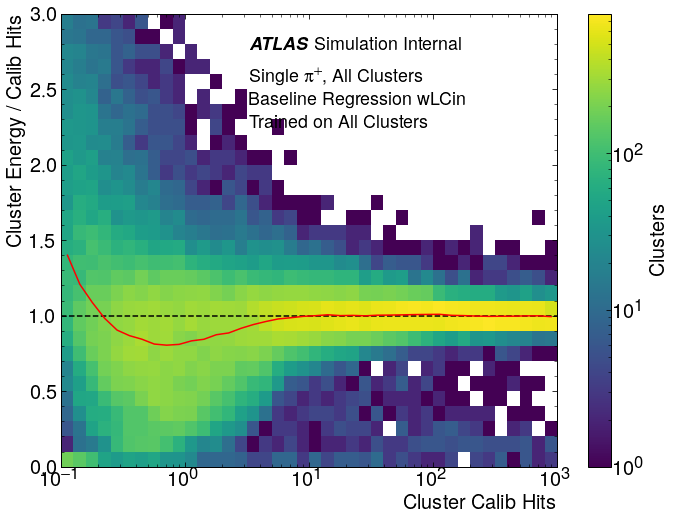

In [78]:
xcenter, medRegwLCin = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_base_wlcin_EoverCalib,
                 './hist_2D_calib_vs_ratioReg_wlcin_pp_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'Baseline Regression wLCin'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 799.992x599.976 with 0 Axes>

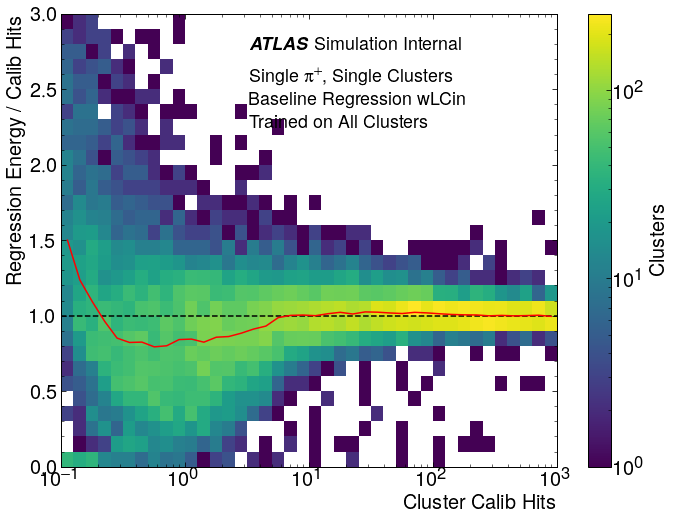

In [79]:
xcenter, medRegwLCinSingle = ru.responsePlot(pp[pp.test & pp.Single].cluster_ENG_CALIB_TOT, 
                      pp[pp.test & pp.Single].predict_base_wlcin_EoverCalib,
                      xlabel = 'Cluster Calib Hits', ylabel = 'Regression Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'Baseline Regression wLCin'},
                                  {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

Also, we can compare to LC directly!

In [80]:
pp['clusterHadE'] = pp.clusterE * pp.cluster_HAD_WEIGHT

In [81]:
pp['clusterHadEoverCalib'] = pp.clusterHadE / pp.cluster_ENG_CALIB_TOT

<Figure size 799.992x599.976 with 0 Axes>

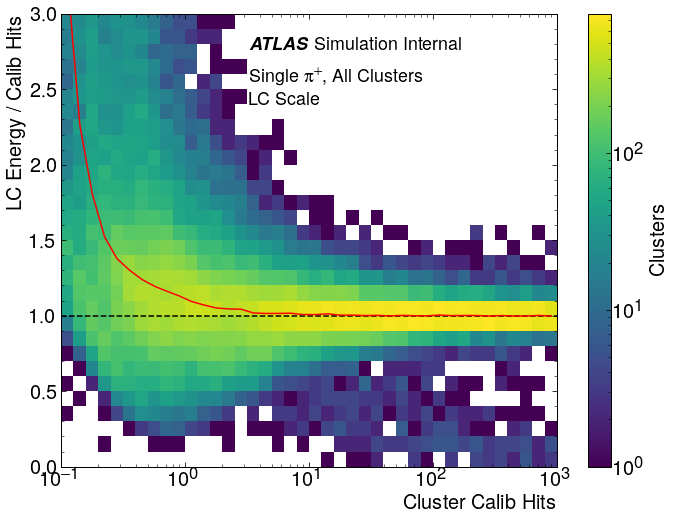

In [83]:
xcenter, medBaseLC = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].clusterHadEoverCalib,
                        './hist_2D_calib_vs_lc_pp_profile','median',
                        xlabel = 'Cluster Calib Hits', ylabel = 'LC Energy / Calib Hits',
                        atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                        textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'LC Scale'}])

<Figure size 799.992x599.976 with 0 Axes>

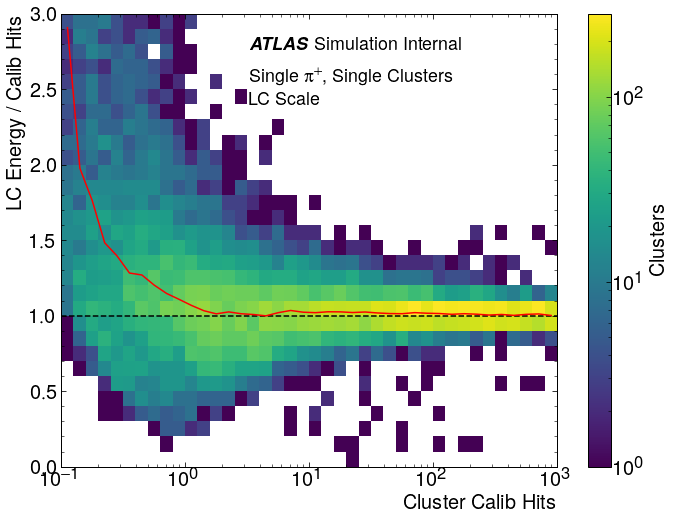

In [84]:
xcenter, medBaseLCSingle = ru.responsePlot(pp[pp.test & pp.Single].cluster_ENG_CALIB_TOT, 
                        pp[pp.test & pp.Single].clusterHadEoverCalib,
                        './hist_2D_calib_vs_lc_pp_profile','median',
                        xlabel = 'Cluster Calib Hits', ylabel = 'LC Energy / Calib Hits',
                        atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                        textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, Single Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'LC Scale'}])

IndexError: list index out of range

<Figure size 799.992x599.976 with 0 Axes>

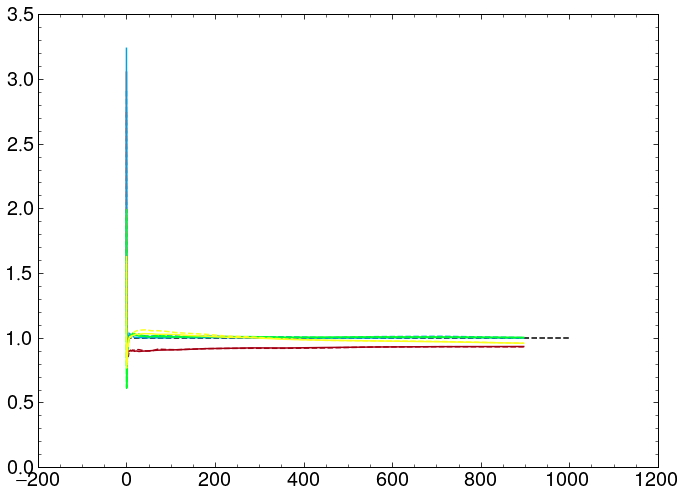

In [85]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medSingleBase, medBaseLC, medBaseLCSingle, medReg, medRegSingle, medRegwLC, medRegwLCSingle, medRegwLCin, medRegwLCinSingle],
                labels = ['EM Scale, All Clusters', 'EM Scale, Single Clusters', 'LC Scale, All Clusters', 'LC Scale, Single Clusters', 'Regressed, All Clusters', 'Regressed, Single Clusters', 'Regressed w/LC All', 'Regressed w/LC Single', 'Regressed w/LCin, All', 'Regressed w/LCin, Single'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                y_max = 3.0,
                extra_lines = [[[0.1,1000],[1,1]]],
                linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.275, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.175, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.125,  'text': 'Baseline Regression'},
                                  {'x': 0.5, 'y': 0.075, 'text': 'Trained on All Clusters'}])

LC is good at high energy, bad at low. The regressions using LC info are pretty decent-- good at high, with the funny features at low.

<Figure size 799.992x599.976 with 0 Axes>

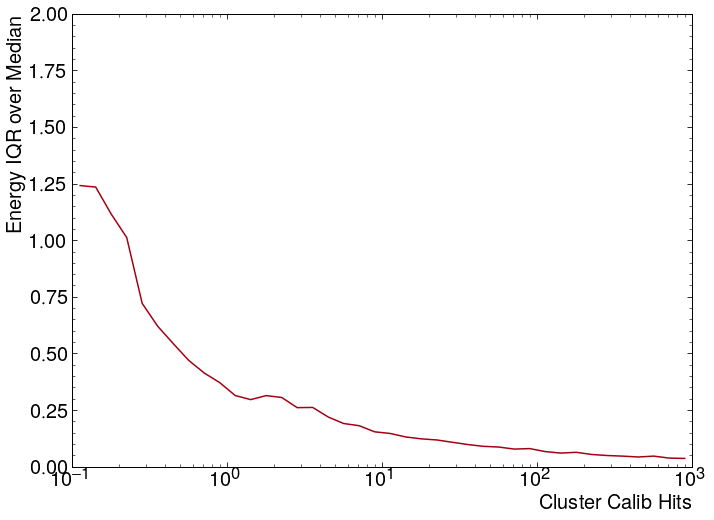

In [86]:
xcenter, iqrOverMedLC = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].clusterHadEoverCalib, statistic='iqrOverMed')

<Figure size 799.992x599.976 with 0 Axes>

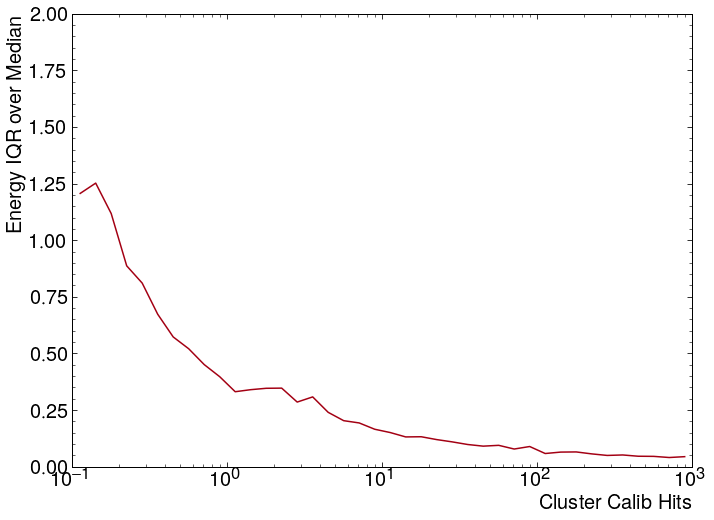

In [87]:
xcenter, iqrOverMedLCSingle = ru.resolutionPlot(pp[pp.Single & pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.Single & pp.test].clusterHadEoverCalib, statistic='iqrOverMed')

<Figure size 799.992x599.976 with 0 Axes>

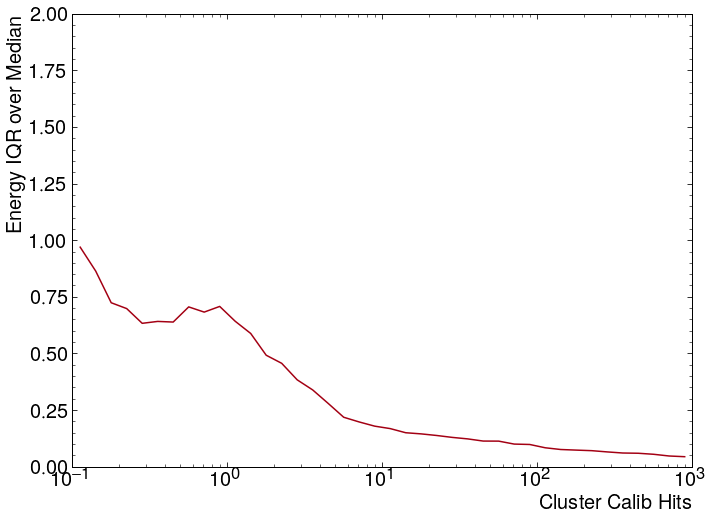

<Figure size 799.992x599.976 with 0 Axes>

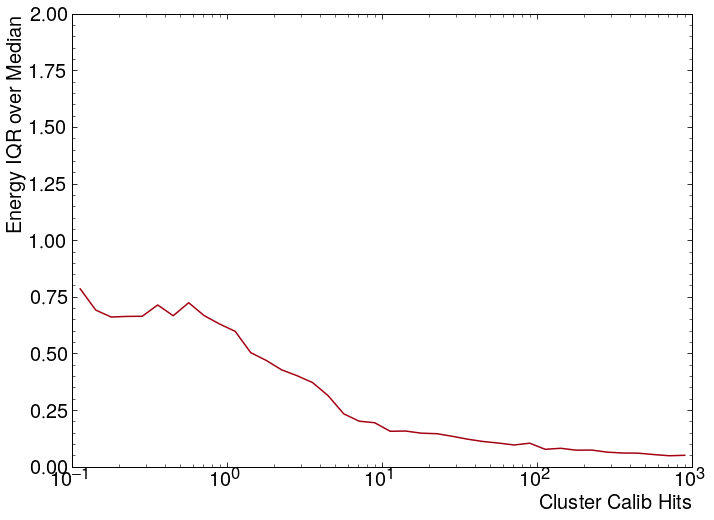

In [88]:
xcenter, iqrOverMedRegwLCin = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].predict_base_wlcin_EoverCalib, statistic='iqrOverMed')
xcenter, iqrOverMedRegwLCinSingle = ru.resolutionPlot(pp[pp.Single & pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.Single & pp.test].predict_base_wlcin_EoverCalib, statistic='iqrOverMed')

IndexError: list index out of range

<Figure size 799.992x599.976 with 0 Axes>

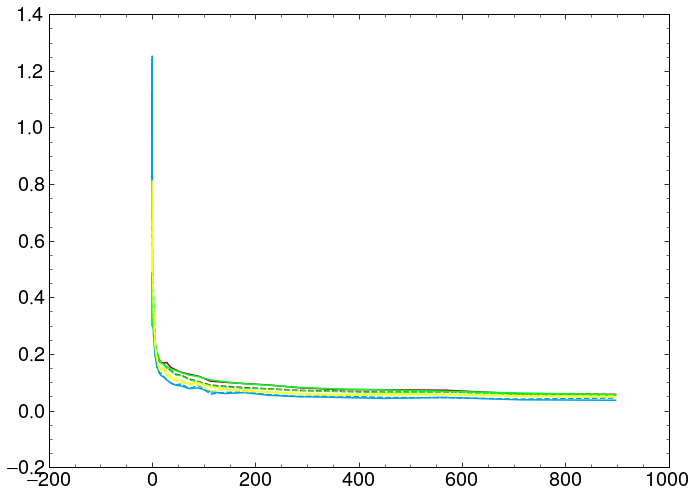

In [90]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase, iqrOverMedSingle, iqrOverMedLC, iqrOverMedLCSingle, iqrOverMedReg, iqrOverMedRegSingle, iqrOverMedRegwlc, iqrOverMedRegwlcSingle, iqrOverMedRegwLCin, iqrOverMedRegwLCinSingle],
                labels = ['EM Scale, All Clusters', 'EM Scale, Single Clusters', 'LC Scale, All Clusters', 'LC Scale, Single Clusters', 'Regressed, All Clusters', 'Regressed, Single Clusters', 'Regressed w/LC All', 'Regressed w/LC Single', 'Regressed w/LCin All', 'Regressed w/LCin Single'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                y_max = 2.75,
                linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.375, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.275, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.225,  'text': 'Baseline Regression'},
                            {'x': 0.5, 'y': 0.175, 'text': 'Trained on All Clusters'}])

Not beating LC at high values (yet!) Interesting. This has some weird features at 1 GeV still. Very strange.

# Train a regression using full cell layer info?

In [78]:
pp_Small = pp[:10]

cells are a pain in pandas, which doesn't want to store vectors in its columns. One could use a structured numpy array, but probably a separate numpy array per layer is fine. We can then use all the usual filters we have in the frame to grab our setup subsets easily.

## First, some debugging about the values in the cells

How to normalize? First make a plot:

No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

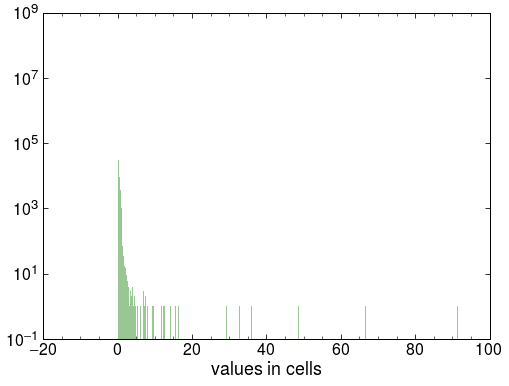

In [81]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(EMB1_cells.reshape(len(EMB1_cells)*len(EMB1_cells[0])),bins = n_bins)
plt.yscale('log')
plt.xlabel('values in cells')
plt.legend()
plt.show()

In [82]:
import collections

In [83]:
collections.Counter(np.greater(EMB1_cells.reshape(len(EMB1_cells)*len(EMB1_cells[0])), 1))

Counter({False: 223214480, True: 624})

Ok, this is a weird problem!!!  624 cells are bad... maybe more implicitly. How weird.

In [84]:
def find_bad_cell(array, thresh):
    bad_clusters = []
    for iC, cluster in enumerate(array):
        foundBadCell = False
        for cell in cluster:
            if cell > thresh:
                foundBadCell = True
        if foundBadCell:
            bad_clusters.append(iC)
    return bad_clusters
        

In [85]:
above5 = find_bad_cell(EMB1_cells, 5)

In [86]:
print(above5)

[6402, 9218, 15085, 33434, 42089, 47420, 60668, 88268, 103401, 124366, 137202, 154684, 158181, 161846, 162082, 175169, 195957, 201165, 206380, 229975, 236626, 239453, 250269, 280097, 289816, 299640, 302025, 305625, 314113, 318175, 358391, 358968, 371704, 424253, 429624, 435406]


In [87]:
EMB1_cells[42089]

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [88]:
EMB2_cells[42089]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [89]:
pp.cluster_cellE_norm

entry
0         [0.31853524, 0.0076545365, 0.25650582, 0.02611...
1         [0.027513273, 0.0021719737, 0.0013425057, 0.00...
2                       [0.6538643, 0.18118072, 0.16495493]
3         [0.16594508, 0.0015814339, 0.05095686, 0.01340...
4                                                     [1.0]
                                ...                        
435962    [0.23387866, 0.008866438, 0.006691358, 0.00268...
435963    [0.49174085, 0.060185365, 0.010226395, 0.02072...
435964    [0.101409234, 0.007867423, 0.07660544, 0.00523...
435965    [0.2748373, 0.005323416, 0.045132488, 0.155698...
435966     [0.6234799, 0.07199959, 0.19202979, 0.112490736]
Name: cluster_cellE_norm, Length: 435967, dtype: object

In [90]:
cellE = pp.cluster_cellE_norm.to_numpy()


In [91]:
cellE[42089]

array([14.154468  ,  0.70272255,  0.27167752,  0.48755297], dtype=float32)

In [92]:
sumCellENorm = []
for cluster in cellE:
    cluster_total = 0
    for cell in cluster:
        cluster_total += cell
    sumCellENorm.append(cluster_total)

No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

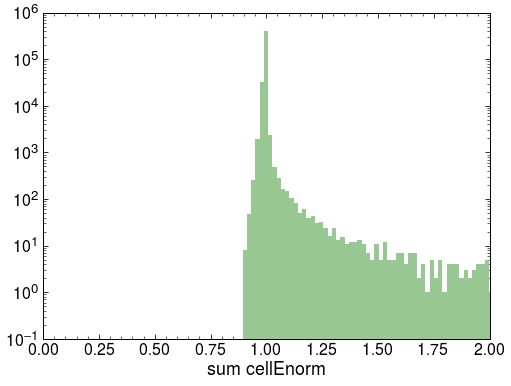

In [93]:
n_bins = 5000
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(sumCellENorm,bins = n_bins)
plt.yscale('log')
plt.xlabel('sum cellEnorm')
plt.xlim(0,2)
plt.legend()
plt.show()

Thoughts: this is definitely weird. I think some of it will be from the noise suppression and the negative energy suppression. Next versions of the tuple should include a running sum of the suppresed things so I can remove this.

## Back to regularizing!

I /think/ what we want to do, is flatten the cells in each layer completely, standardize that, then reshape back to the right form. If *one* regularizer is applied to all cells, the relationship between cells in an event will remain. This is what I want.

In [18]:
from util import ml_util as mu

In [19]:
s_EMB1_cells, scaler_EMB1_cells = mu.standardCells(EMB1_cells, 'EMB1')

NameError: name 'EMB1_cells' is not defined

Not sure this is the right idea. The standard scaler measures such a low variance that it blows things up! This is because of all the 0's. Maybe I should be excluding 0s from the fitting.

No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

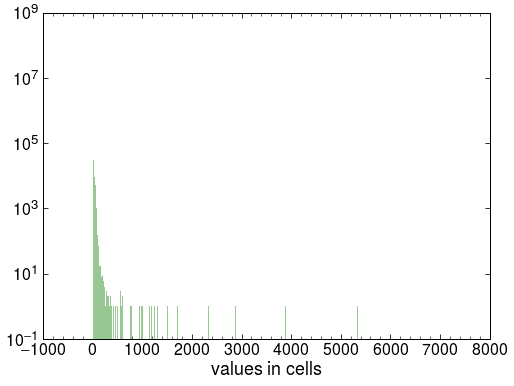

In [96]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(s_EMB1_cells.reshape(len(s_EMB1_cells)*len(s_EMB1_cells[0])), bins = n_bins)
plt.yscale('log')
plt.xlabel('values in cells')
plt.legend()
plt.show()

No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

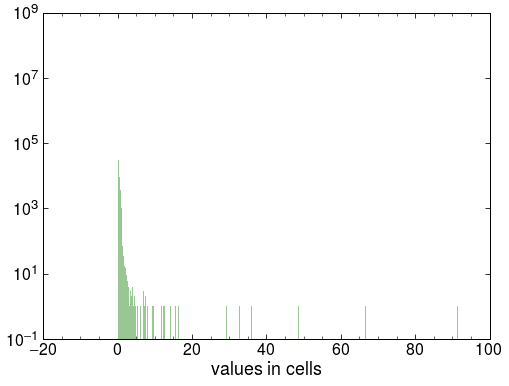

In [97]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(EMB1_cells.reshape(len(EMB1_cells)*len(EMB1_cells[0])),bins = n_bins)
plt.yscale('log')
plt.xlabel('values in cells')
plt.legend()
plt.show()

In [98]:
# define baseline fully-connected NN model
def baseline_nn_model():
    number_pixels = 512
    # create model
    with strategy.scope():    
        model = Sequential()
        used_pixels = number_pixels
#     if number_pixels < 128:
#         used_pixels = 128
        model.add(Dense(number_pixels, input_dim=number_pixels+1, kernel_initializer='normal', activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(used_pixels, activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(int(used_pixels/2), activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
        opt = Adam(lr=1e-4, decay=1e-6)
        model.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])
    return model

In [99]:
regressor_EMB1 = KerasRegressor(build_fn=baseline_nn_model, batch_size=200*ngpu, epochs=50, verbose=1)
print(baseline_nn_model().summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 512)               263168    
_________________________________________________________________
dense_10 (Dense)             (None, 512)               262656    
_________________________________________________________________
dense_11 (Dense)             (None, 256)               131328    
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 257       
Total params: 657,409
Trainable params: 657,409
Non-trainable params: 0
_________________________________________________________________
None


In [100]:
EMB1_input = np.column_stack((pp['s_logE'],s_EMB1_cells))

In [101]:
if not loadModel:
    history_baseline_wlcin = regressor_EMB1.fit(EMB1_input[pp.train], pp[pp.train].s_logECalib.to_numpy())
else:
    regressor_EMB1.model = load_model(modelpath + 'emb1.h5')

In [102]:
if saveModel:
    regressor_EMB1.model.save(modelpath + 'emb1.h5')

In [103]:
pp['predict_regressor_EMB1'] = np.exp(scaler_cal.inverse_transform(regressor_EMB1.predict(EMB1_input)))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in exp
  """Entry point for launching an IPython kernel.


In [104]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_EMB1-pp.clusterE,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Cluster Energy')
plt.legend()
plt.show()

ValueError: supplied range of [-216.464111328125, inf] is not finite

In [158]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_EMB1-pp.cluster_ENG_CALIB_TOT,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Actual Energy')
plt.legend()
plt.show()

ValueError: supplied range of [-1557.461181640625, inf] is not finite

In [211]:
pp['predict_regressor_EMB1_EoverCalib'] = pp.predict_regressor_EMB1/ pp.cluster_ENG_CALIB_TOT

<Figure size 576x432 with 0 Axes>

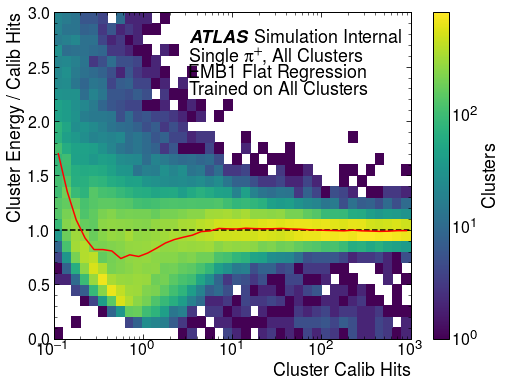

In [212]:
xcenter, medRegEMB1 = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_regressor_EMB1 / pp[pp.test].cluster_ENG_CALIB_TOT,
                 plotpath+'hist_2D_calib_vs_ratioReg_EMB1_pp_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'EMB1 Flat Regression'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

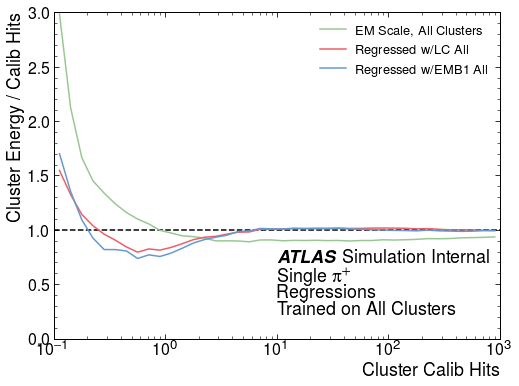

In [213]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medRegwLC, medRegEMB1],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_profile_Overlay_BaseRegLCEMB1.pdf",
                y_max = 3.0,
                extra_lines = [[[0.1,1000],[1,1]]],
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.275, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.175, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.125,  'text': 'Regressions'},
                                  {'x': 0.5, 'y': 0.075, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

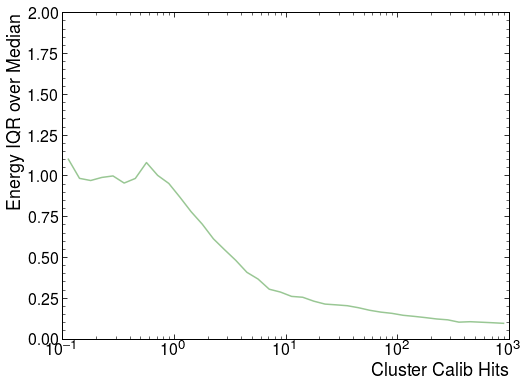

In [214]:
xcenter, iqrOverMedEMB1 = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].predict_regressor_EMB1_EoverCalib, statistic='iqrOverMed')

<Figure size 576x432 with 0 Axes>

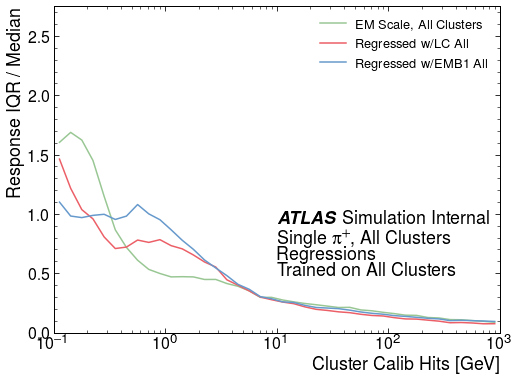

In [215]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase,  iqrOverMedRegwlc, iqrOverMedEMB1],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_res_Overlay_BaseRegLCEMB1.pdf",
                y_max = 2.75,
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.375, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.275, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.225,  'text': 'Regressions'},
                            {'x': 0.5, 'y': 0.175, 'text': 'Trained on All Clusters'}])

Ok, not super performant right now, but at least it's working at all! Probably just ignoring the cells though, should compare to the baseline energy regression too

In [217]:
s_TileBar0_cells, scaler_TileBar0_cells = mu.standardCells(TileBar0_cells, 'TileBar0')

In [218]:
def baseline_nn_tile0_model():
    number_pixels = 16
    # create model
    with strategy.scope():    
        model = Sequential()
        used_pixels = number_pixels
#     if number_pixels < 128:
#         used_pixels = 128
        model.add(Dense(number_pixels, input_dim=number_pixels+1, kernel_initializer='normal', activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(used_pixels, activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(int(used_pixels/2), activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
        opt = Adam(lr=1e-4, decay=1e-6)
        model.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])
    return model

In [219]:
regressor_TileBar0 = KerasRegressor(build_fn=baseline_nn_tile0_model, batch_size=200*ngpu, epochs=50, verbose=1)
print(baseline_nn_tile0_model().summary())

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_37 (Dense)             (None, 16)                288       
_________________________________________________________________
dense_38 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_39 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_40 (Dense)             (None, 1)                 9         
Total params: 705
Trainable params: 705
Non-trainable params: 0
_________________________________________________________________
None


In [220]:
TileBar0_input = np.column_stack((pp['s_logE'],s_TileBar0_cells))

In [221]:
if not loadModel:
    history_baseline_wlcin = regressor_TileBar0.fit(TileBar0_input[pp.train], pp[pp.train].s_logECalib.to_numpy())
else:
    regressor_TileBar0.model = load_model(modelpath + 'tilebar0.h5')

In [222]:
if saveModel:
    regressor_TileBar0.model.save(modelpath + 'tilebar0.h5')

In [223]:
pp['predict_regressor_TileBar0'] = np.exp(scaler_cal.inverse_transform(regressor_TileBar0.predict(TileBar0_input)))

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

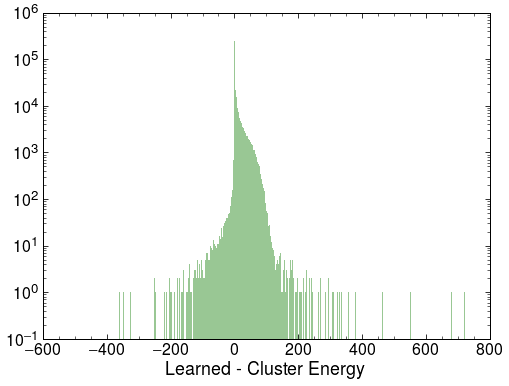

In [224]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_TileBar0-pp.clusterE,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Cluster Energy')
plt.legend()
plt.show()

No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

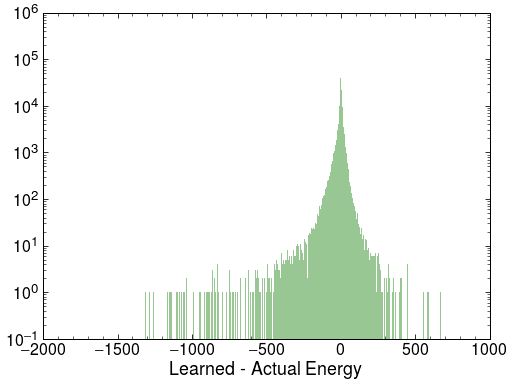

In [225]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_TileBar0-pp.cluster_ENG_CALIB_TOT,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Actual Energy')
plt.legend()
plt.show()

In [226]:
pp['predict_regressor_TileBar0_EoverCalib'] = pp.predict_regressor_TileBar0/ pp.cluster_ENG_CALIB_TOT

<Figure size 576x432 with 0 Axes>

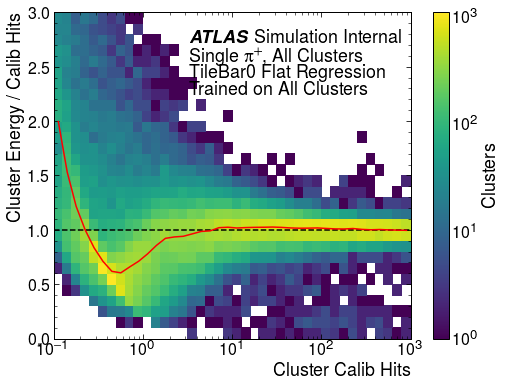

In [227]:
xcenter, medRegTileBar0 = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_regressor_TileBar0_EoverCalib,
                 plotpath+'hist_2D_calib_vs_ratioReg_TileBar0_pp_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'TileBar0 Flat Regression'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

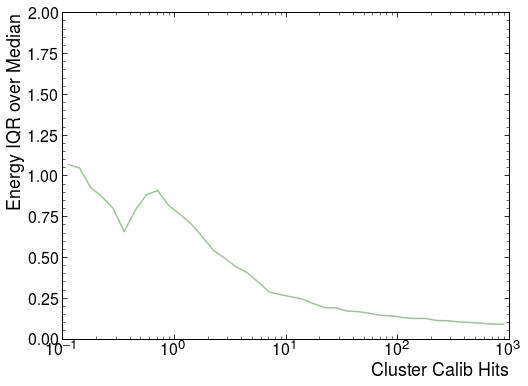

In [228]:
xcenter, iqrOverMedTileBar0 = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].predict_regressor_TileBar0_EoverCalib, statistic='iqrOverMed')

<Figure size 576x432 with 0 Axes>

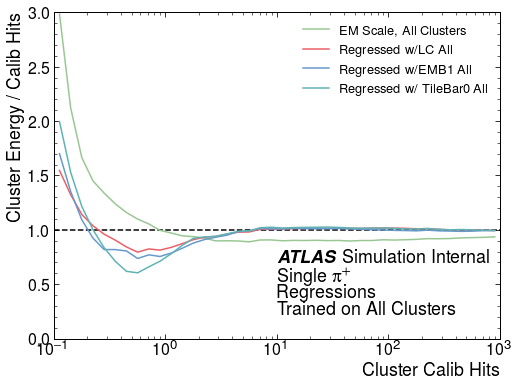

In [229]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medRegwLC, medRegEMB1, medRegTileBar0],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All', 'Regressed w/ TileBar0 All'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_profile_Overlay_BaseRegLCEMB1TileBar0.pdf",
                y_max = 3.0,
                extra_lines = [[[0.1,1000],[1,1]]],
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.275, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.175, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.125,  'text': 'Regressions'},
                                  {'x': 0.5, 'y': 0.075, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

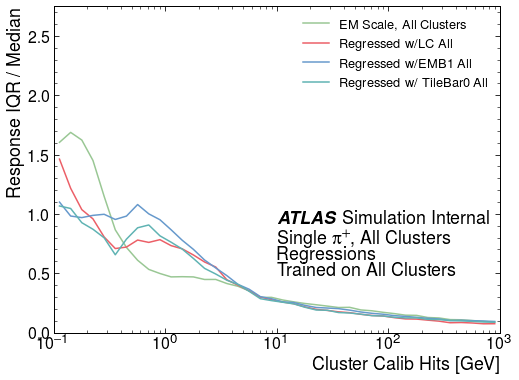

In [230]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase,  iqrOverMedRegwlc, iqrOverMedEMB1, iqrOverMedTileBar0],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All', 'Regressed w/ TileBar0 All'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_res_Overlay_BaseRegLCEMB1.pdf",
                y_max = 2.75,
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.375, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.275, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.225,  'text': 'Regressions'},
                            {'x': 0.5, 'y': 0.175, 'text': 'Trained on All Clusters'}])

Resolution good up to 100 GeV! That's neat.

## Can I train a combined EMB1 + TileBar0 NN?

I think how I want to do this is normalize them all at once like this...

In [231]:
combine_EMB1_TileBar0_cells = np.concatenate((EMB1_cells, TileBar0_cells), axis=1)

In [232]:
s_E1T0_cells, scaler_E1T0_cells = mu.standardCells(combine_EMB1_TileBar0_cells, ['EMB1', 'TileBar0'])

I' not sure this is the right thing-- keeping it all still as one input. Could have separate nodes, once things are standardized. Would have to pick apart the array again, if I want to try this.

In [233]:
def baseline_nn_E1T0_model():
    number_pixels = 512 + 16
    # create model
    with strategy.scope():    
        model = Sequential()
        used_pixels = number_pixels + 2
#     if number_pixels < 128:
#         used_pixels = 128
        model.add(Dense(used_pixels, input_dim=used_pixels, kernel_initializer='normal', activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(used_pixels, activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(int(used_pixels/2), activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
        opt = Adam(lr=1e-4, decay=1e-6)
        model.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])
    return model

In [234]:
regressor_E1T0 = KerasRegressor(build_fn=baseline_nn_E1T0_model, batch_size=200*ngpu, epochs=50, verbose=1)
print(baseline_nn_E1T0_model().summary())


Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_41 (Dense)             (None, 530)               281430    
_________________________________________________________________
dense_42 (Dense)             (None, 530)               281430    
_________________________________________________________________
dense_43 (Dense)             (None, 265)               140715    
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 266       
Total params: 703,841
Trainable params: 703,841
Non-trainable params: 0
_________________________________________________________________
None


In [235]:
E1T0_input = np.column_stack((pp['s_logE'],pp['s_eta'],s_E1T0_cells))

In [236]:
if not loadModel:
    history_baseline_e1t0 = regressor_E1T0.fit(E1T0_input[pp.train], pp[pp.train].s_logECalib.to_numpy())
else:
    regressor_E1T0.model = load_model(modelpath + 'e1t0.h5')

In [237]:
if saveModel:
    regressor_E1T0.model.save(modelpath + 'e1t0.h5')

In [238]:
pp['predict_regressor_E1T0'] = np.exp(scaler_cal.inverse_transform(regressor_E1T0.predict(E1T0_input)))
pp['predict_regressor_E1T0_EoverCalib'] = pp.predict_regressor_E1T0/ pp.cluster_ENG_CALIB_TOT

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

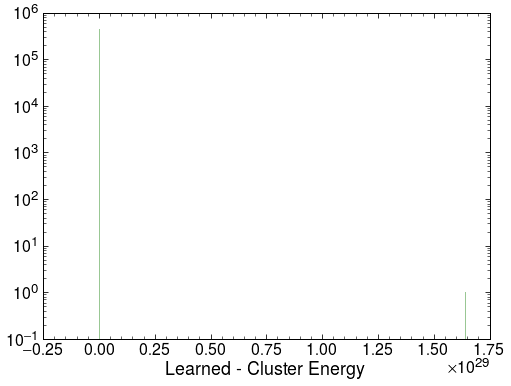

In [239]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_E1T0-pp.clusterE,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Cluster Energy')
plt.legend()
plt.show()

No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

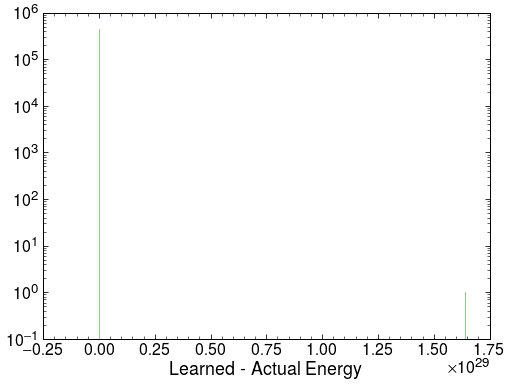

In [240]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_E1T0-pp.cluster_ENG_CALIB_TOT,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - Actual Energy')
plt.legend()
plt.show()

<Figure size 576x432 with 0 Axes>

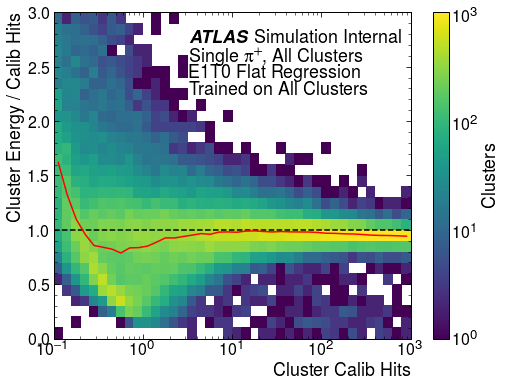

In [241]:
xcenter, medRegE1T0 = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_regressor_E1T0_EoverCalib,
                 plotpath+'hist_2D_calib_vs_ratioReg_E1T0_pp_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'E1T0 Flat Regression'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

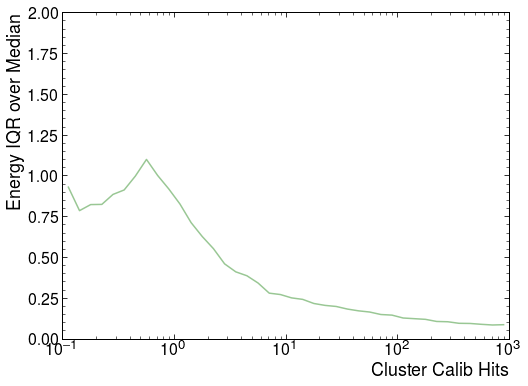

In [242]:
xcenter, iqrOverMedE1T0 = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].predict_regressor_E1T0_EoverCalib, statistic='iqrOverMed')

<Figure size 576x432 with 0 Axes>

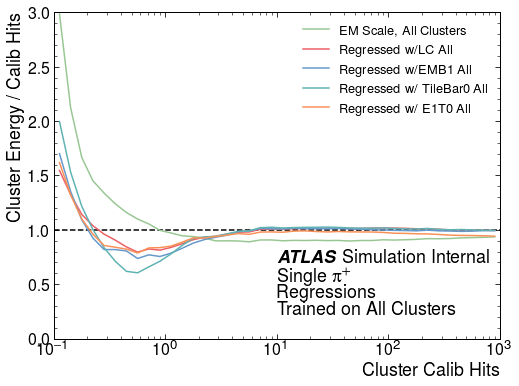

In [243]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medRegwLC, medRegEMB1, medRegTileBar0, medRegE1T0],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All', 'Regressed w/ TileBar0 All', 'Regressed w/ E1T0 All'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_profile_Overlay_BaseRegLCEMB1TileBar0E1T0.pdf",
                y_max = 3.0,
                extra_lines = [[[0.1,1000],[1,1]]],
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.275, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.175, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.125,  'text': 'Regressions'},
                                  {'x': 0.5, 'y': 0.075, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

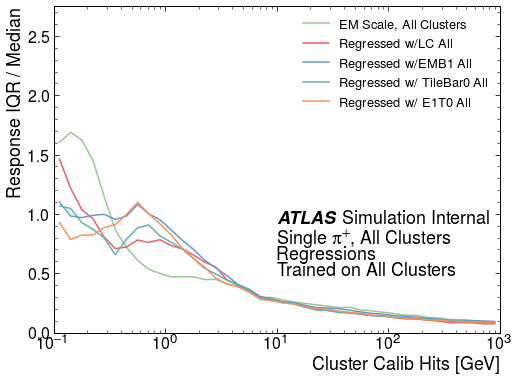

In [244]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase,  iqrOverMedRegwlc, iqrOverMedEMB1, iqrOverMedTileBar0, iqrOverMedE1T0 ],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All', 'Regressed w/ TileBar0 All', 'Regressed w/ E1T0 All'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_res_Overlay_BaseRegLCEMB1TileBar0E1T0.pdf",
                y_max = 2.75,
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.375, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.275, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.225,  'text': 'Regressions'},
                            {'x': 0.5, 'y': 0.175, 'text': 'Trained on All Clusters'}])

Ok, this isn't necessarily great...

## Try all the layers? Why not...

In [20]:
def baseline_nn_All_model():
    number_pixels = 512 + 256 + 128 + 16 + 16 +8
    # create model
    with strategy.scope():    
        model = Sequential()
        used_pixels = number_pixels + 2
#     if number_pixels < 128:
#         used_pixels = 128
        model.add(Dense(used_pixels, input_dim=used_pixels, kernel_initializer='normal', activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(used_pixels, activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(int(used_pixels/2), activation='relu'))
        # model.add(Dropout(0.2))
        model.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
        opt = Adam(lr=1e-4, decay=1e-6)
        model.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])
    return model

In [21]:
regressor_All = KerasRegressor(build_fn=baseline_nn_All_model, batch_size=200*ngpu, epochs=100, verbose=1)
print(baseline_nn_All_model().summary())


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 938)               880782    
_________________________________________________________________
dense_1 (Dense)              (None, 938)               880782    
_________________________________________________________________
dense_2 (Dense)         

In [28]:
if not loadModel:
    history_baseline_all = regressor_All.fit(All_input[pp.train], pp[pp.train].s_logECalib.to_numpy())
else:
    regressor_All.model = load_model(modelpath + 'all.h5')

NameError: name 'regressor_All' is not defined

Evidence for more training helping here, actually

In [252]:
if saveModel:
    regressor_All.model.save(modelpath + 'all.h5')

In [253]:
pp['predict_regressor_All'] = np.exp(scaler_cal.inverse_transform(regressor_All.predict(All_input)))
pp['predict_regressor_All_EoverCalib'] = pp.predict_regressor_All / pp.cluster_ENG_CALIB_TOT

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



No handles with labels found to put in legend.


<Figure size 576x432 with 0 Axes>

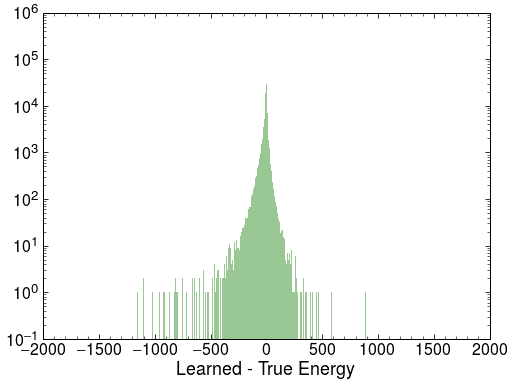

In [254]:
n_bins = 500
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.hist(pp.predict_regressor_All-pp.cluster_ENG_CALIB_TOT,bins = n_bins)
plt.yscale('log')
plt.xlabel('Learned - True Energy')
plt.legend()
plt.show()

<Figure size 576x432 with 0 Axes>

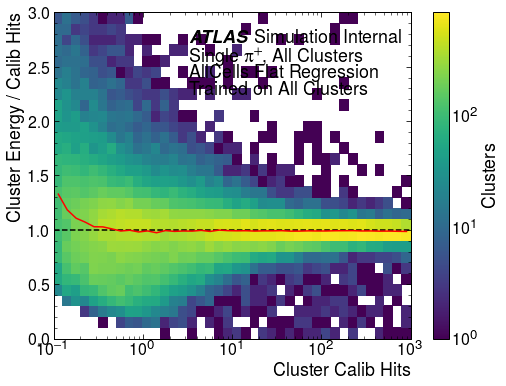

In [255]:
xcenter, medRegAll = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_regressor_All_EoverCalib,
                 plotpath+'hist_2D_calib_vs_ratioReg_E1T0_pp_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'AllCells Flat Regression'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

Potentially some over training? Also room for more training. This is the model to develop!

<Figure size 576x432 with 0 Axes>

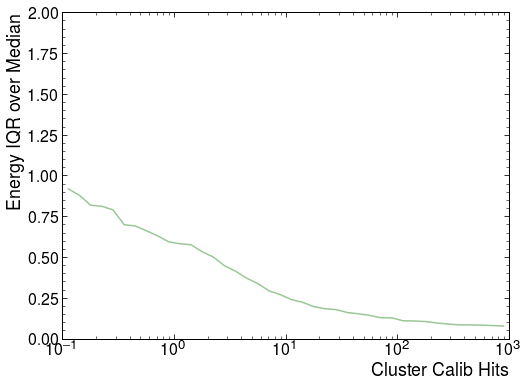

In [256]:
xcenter, iqrOverMedAll = ru.resolutionPlot(pp[pp.test].cluster_ENG_CALIB_TOT, 
                        pp[pp.test].predict_regressor_All_EoverCalib, statistic='iqrOverMed')

<Figure size 576x432 with 0 Axes>

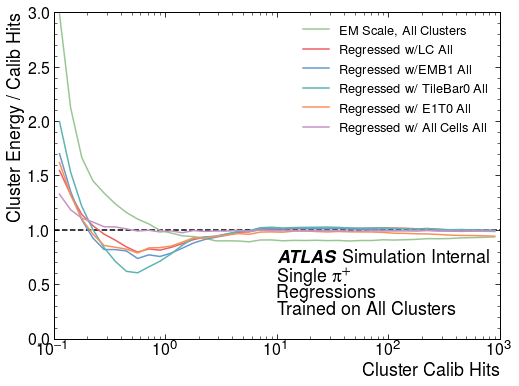

In [257]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase, medRegwLC, medRegEMB1, medRegTileBar0, medRegE1T0, medRegAll],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All', 'Regressed w/ TileBar0 All', 'Regressed w/ E1T0 All', 'Regressed w/ All Cells All'],
                xlabel = 'Cluster Calib Hits', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_profile_Overlay_BaseRegLCEMB1TileBar0E1T0All.pdf",
                y_max = 3.0,
                extra_lines = [[[0.1,1000],[1,1]]],
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.275, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.175, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.125,  'text': 'Regressions'},
                                  {'x': 0.5, 'y': 0.075, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

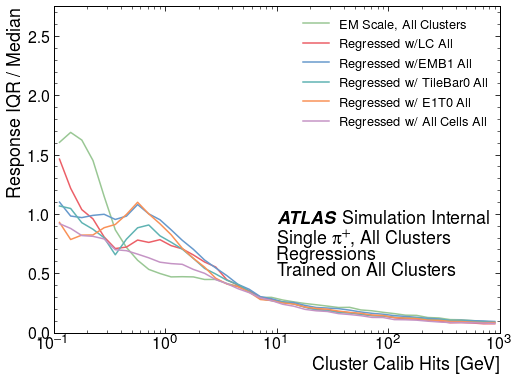

In [258]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase,  iqrOverMedRegwlc, iqrOverMedEMB1, iqrOverMedTileBar0, iqrOverMedE1T0, iqrOverMedAll ],
                labels = ['EM Scale, All Clusters', 'Regressed w/LC All', 'Regressed w/EMB1 All', 'Regressed w/ TileBar0 All', 'Regressed w/ E1T0 All', 'Regressed w/ All Cells All'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_res_Overlay_BaseRegLCEMB1TileBar0E1T0All.pdf",
                y_max = 2.75,
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.375, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.275, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.5, 'y': 0.225,  'text': 'Regressions'},
                            {'x': 0.5, 'y': 0.175, 'text': 'Trained on All Clusters'}])

<Figure size 576x432 with 0 Axes>

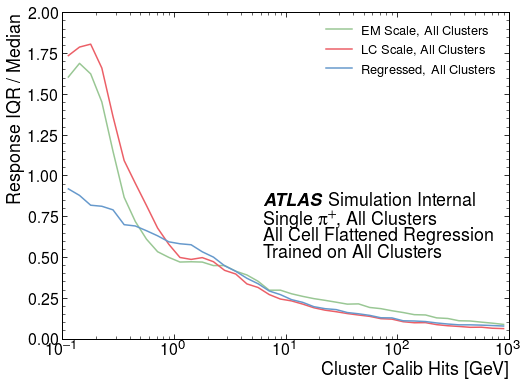

In [259]:
pu.lineOverlay(xcenter=xcenter, lines = [iqrOverMedBase,  iqrOverMedLC, iqrOverMedAll ],
                labels = ['EM Scale, All Clusters', 'LC Scale, All Clusters', 'Regressed, All Clusters'],
                xlabel = 'Cluster Calib Hits [GeV]', ylabel = 'Response IQR / Median',
                figfile = plotpath + "hist_2D_calib_vs_ratio_pp_res_Overlay_BaseLCAll.pdf",
                y_max = 2,
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.45, atlas_y = 0.45, simulation = True,
                textlist = [{'x': 0.45, 'y': 0.35, 'text': 'Single $\pi^{+}$, All Clusters'},
                            {'x': 0.45, 'y': 0.3,  'text': 'All Cell Flattened Regression'},
                            {'x': 0.45, 'y': 0.25, 'text': 'Trained on All Clusters'}])

IT WORKS!!! Only slightly worse than LC at high values in resolution. Completely flat response function!

<Figure size 576x432 with 0 Axes>

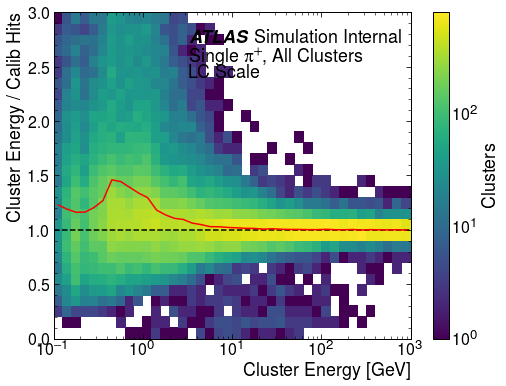

In [260]:
xcenter, medLC_E = ru.responsePlot(pp[pp.test].clusterE * pp[pp.test].cluster_HAD_WEIGHT,
                      pp[pp.test].clusterE * pp[pp.test].cluster_HAD_WEIGHT/ pp[pp.test].cluster_ENG_CALIB_TOT, 
                      figfile = plotpath+'hist_2D_E_vs_ratioLC_pp_profile.pdf', statistic = 'median',
                      xlabel = 'Cluster Energy [GeV]', ylabel = 'Cluster Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'LC Scale'}])

<Figure size 576x432 with 0 Axes>

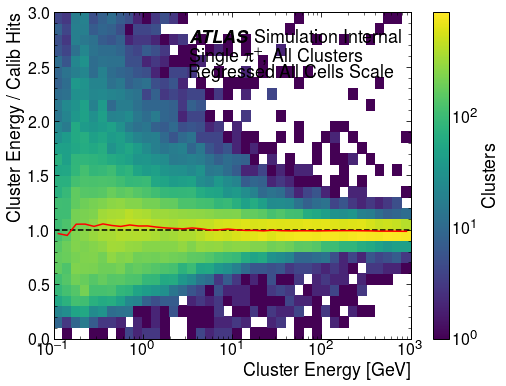

In [261]:
xcenter, medRegAll_E = ru.responsePlot(pp[pp.test].predict_regressor_All, pp[pp.test].predict_regressor_All_EoverCalib, 
                      figfile = plotpath+'hist_2D_E_vs_ratioRegAll_pp_profile.pdf', statistic = 'median',
                      xlabel = 'Cluster Energy [GeV]', ylabel = 'Cluster Energy / Calib Hits',
                      atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                      textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                                  {'x': 0.38, 'y': 0.8,  'text': 'Regressed All Cells Scale'}])

<Figure size 576x432 with 0 Axes>

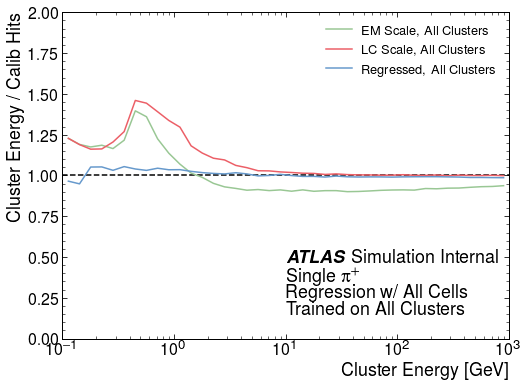

In [262]:
pu.lineOverlay(xcenter=xcenter, lines = [medBase_E, medLC_E, medRegAll_E],
                                labels = ['EM Scale, All Clusters', 'LC Scale, All Clusters', 'Regressed, All Clusters'],
                xlabel = 'Cluster Energy [GeV]', ylabel = 'Cluster Energy / Calib Hits',
                figfile = plotpath + "hist_2D_E_vs_ratio_pp_profile_Overlay_Overlay_BaseLCAll.pdf",
                y_max = 2.0,
                extra_lines = [[[0.1,1000],[1,1]]],
                # linestyles = ['solid', 'dashed', 'solid', 'dashed', 'solid','dashed','solid','dashed','solid','dashed'], colorgrouping=2,
                atlas_x = 0.5, atlas_y = 0.275, simulation = True,
                textlist = [{'x': 0.5, 'y': 0.175, 'text': 'Single $\pi^{+}$'},
                                  {'x': 0.5, 'y': 0.125,  'text': 'Regression w/ All Cells'},
                                  {'x': 0.5, 'y': 0.075, 'text': 'Trained on All Clusters'}])

## Improving the model: can I fix the weird tails?

Two hypotheses on this:

* Not enough training
* Overtraining to the training data?

First, let's just train a model longer...

In [20]:
def baseline_nn_All_Debug_model():
    number_pixels = 512 + 256 + 128 + 16 + 16 +8
    # create model
    with strategy.scope():    
        model = Sequential()
        used_pixels = number_pixels + 2
#     if number_pixels < 128:
#         used_pixels = 128
        model.add(Dense(used_pixels, input_dim=used_pixels, kernel_initializer='normal', activation='relu'))
        # model.add(Dropout(0.1))
        model.add(Dense(used_pixels, activation='relu'))
        # model.add(Dropout(0.1))
        model.add(Dense(int(used_pixels/2), activation='relu'))
        # model.add(Dropout(0.1))
        model.add(Dense(units=1, kernel_initializer='normal', activation='linear'))
        # opt = Adam(lr=1e-4, decay=1e-6)
        opt = Adam(lr=1e-5, decay=1e-6)
        model.compile(optimizer=opt, loss='mse',metrics=['mae','mse'])
    return model

In [21]:
regressor_All_Debug = KerasRegressor(build_fn=baseline_nn_All_Debug_model, batch_size=200*ngpu, epochs=200, verbose=1)
print(baseline_nn_All_Debug_model().summary())

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 938)               880782    
_________________________________________________________________
dense_1 (Dense)              (None, 938)               880782    
_________________________________________________________________
dense_2 (Dense)         

In [22]:
loadModel = False

In [23]:
if not loadModel:
    history_baseline_all_debug = regressor_All_Debug.fit(All_input[pp.train], pp[pp.train].s_logECalib.to_numpy(), validation_data = (All_input[pp.val], pp[pp.val].s_logECalib.to_numpy()) , verbose = 2)
else:
    regressor_All_Debug.model = load_model(modelpath + 'all_debug.h5')

: 0.0182
Epoch 48/200
305176/305176 - 7s - loss: 0.0381 - mae: 0.0833 - mse: 0.0381 - val_loss: 0.0186 - val_mae: 0.0823 - val_mse: 0.0186
Epoch 49/200
305176/305176 - 7s - loss: 0.0601 - mae: 0.0856 - mse: 0.0601 - val_loss: 0.0165 - val_mae: 0.0804 - val_mse: 0.0165
Epoch 50/200
305176/305176 - 7s - loss: 0.0226 - mae: 0.0800 - mse: 0.0226 - val_loss: 0.0165 - val_mae: 0.0793 - val_mse: 0.0165
Epoch 51/200
305176/305176 - 7s - loss: 0.0277 - mae: 0.0809 - mse: 0.0277 - val_loss: 0.0162 - val_mae: 0.0784 - val_mse: 0.0162
Epoch 52/200
305176/305176 - 7s - loss: 0.0894 - mae: 0.0871 - mse: 0.0894 - val_loss: 0.0185 - val_mae: 0.0808 - val_mse: 0.0185
Epoch 53/200
305176/305176 - 7s - loss: 0.0498 - mae: 0.0840 - mse: 0.0498 - val_loss: 0.0164 - val_mae: 0.0795 - val_mse: 0.0164
Epoch 54/200
305176/305176 - 7s - loss: 0.0324 - mae: 0.0816 - mse: 0.0324 - val_loss: 0.0193 - val_mae: 0.0805 - val_mse: 0.0193
Epoch 55/200
305176/305176 - 7s - loss: 0.0273 - mae: 0.0818 - mse: 0.0273 - val_

In [60]:
saveModel = True

In [64]:
if saveModel:
    regressor_All_Debug.model.save(modelpath + 'all_200.h5')

What's the validation look like?

In [23]:
plt.cla(); plt.clf()
fig = plt.figure()
fig.patch.set_facecolor('white')

plt.plot(history_baseline_all_debug.history['loss'])
plt.plot(history_baseline_all_debug.history['val_loss'])
plt.title('model mse for all cells NN')
plt.yscale('log')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


# summarize history for loss
fig = plt.figure()
fig.patch.set_facecolor('white')
plt.plot(history_baseline_all_debug.history['mae'])
plt.plot(history_baseline_all_debug.history['val_mae'])
plt.title('model mae for all cells NN')
plt.ylabel('loss')
plt.yscale('log')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

NameError: name 'history_baseline_all_debug' is not defined

Some evidence of overfitting here! Let's add some dropout layers?

In [25]:
pp['predict_regressor_All_Debug'] = np.exp(scaler_cal.inverse_transform(regressor_All_Debug.predict(All_input)))
pp['predict_regressor_All_Debug_EoverCalib'] = pp.predict_regressor_All_Debug / pp.cluster_ENG_CALIB_TOT

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



<Figure size 576x432 with 0 Axes>

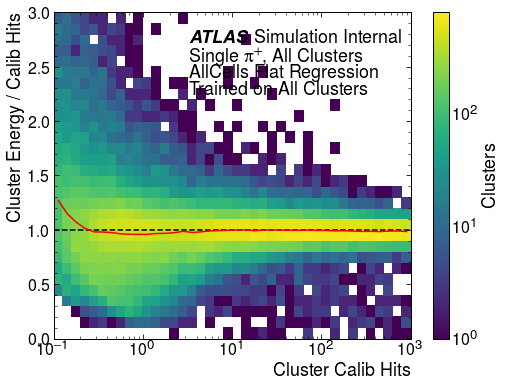

In [27]:
xcenter, medRegAllDebug = ru.responsePlot(pp[pp.test].cluster_ENG_CALIB_TOT, pp[pp.test].predict_regressor_All_Debug_EoverCalib,
                 plotpath+'hist_2D_calib_vs_ratioReg_AllDebug200_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'AllCells Flat Regression'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

Bad move: just see if it's better looking on the train sample...?

<Figure size 576x432 with 0 Axes>

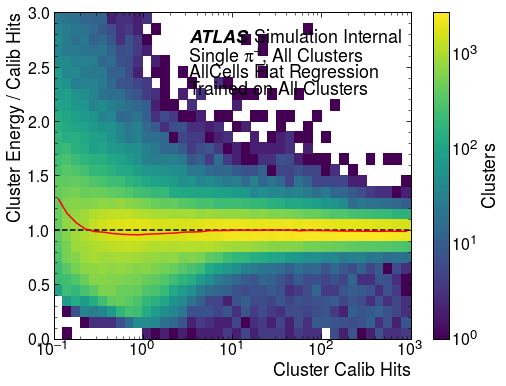

In [28]:
xcenter, medRegAllDebug = ru.responsePlot(pp[pp.train].cluster_ENG_CALIB_TOT, pp[pp.train].predict_regressor_All_Debug_EoverCalib,
                 plotpath+'hist_2D_calib_vs_ratioReg_AllDebugTrain200_profile.pdf',
                 'median',
                 atlas_x = 0.38, atlas_y = 0.95, simulation = True,
                 textlist = [{'x': 0.38, 'y': 0.85, 'text': 'Single $\pi^{+}$, All Clusters'},
                             {'x': 0.38, 'y': 0.8,  'text': 'AllCells Flat Regression'},
                             {'x': 0.38, 'y': 0.75, 'text': 'Trained on All Clusters'}])

Yeah, that's much better behaved, even though it has a lot more stats. So I have reason to believe this model is being overfitted right now, and that's causing the tails at least partly.

Ok, so definitely seeing that more training is leading to worse performance at high values. WEIRD.